# Contact Me

# Business Understanding

In [1]:
###### The Company ######

# Sales channels: physical stores, catalogs and company’s websit

# Product's major categories: wines, rare meat products, exotic fruits, specially prepared fish and sweet products

In [2]:
###### The objectives ######

# Understand the data, find business opportunities & insights and to propose any data driven action to optimize the campaigns results 

# Develop a model that predicts customer behavior and to apply it to the rest of the customer base

# The model will allow the company to cherry pick the customers that are most likely to purchase the offer while leaving out the non-respondents, making the next campaign highly profitable

# Import libraries

In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.express as px

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
from sklearn.model_selection import train_test_split

In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
from ydata_profiling import ProfileReport

In [9]:
pd.set_option('display.max_colwidth', None)

In [ ]:
import itertools

from xgboost                 import XGBClassifier
from lightgbm                import LGBMClassifier
from sklearn.tree            import DecisionTreeClassifier
from sklearn.ensemble        import RandomForestClassifier
from sklearn.metrics         import ConfusionMatrixDisplay, confusion_matrix, precision_score, recall_score, f1_score, accuracy_score, make_scorer
from sklearn import tree
from sklearn.model_selection import cross_val_score

In [10]:
from ydata_profiling import ProfileReport

In [11]:
import warnings
warnings.filterwarnings("ignore")

# Data Preprocessing

## First impressions

In [12]:
# Import dataset
df_original_data = pd.read_csv('customer-segmentation-data-case.csv')

In [13]:
df_original_data.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0


In [14]:
# Convert 
df_original_data['Dt_Customer'] = pd.to_datetime(df_original_data['Dt_Customer'])

In [15]:
# The pandas profiling library is really useful on helping us understand the data we're working on.
# It saves us some precious time on the EDA process.
profile = ProfileReport(df_original_data, title="Profiling Report")

In [16]:
# Print data summary before class segmentation.
# It can provide us with information about null data, their formats, and distinct responses.

# All details 

# Comment to reduce Notebook's load time
# profile

## Interpretation

#### Columns Definition & Meaning

| Feature | Meaning | 
|:---------:|:----------------:|
| AcceptedCmp1 | 1 if customer accepted the offer in the 1st campaign, 0 otherwise |
| AcceptedCmp2 | 1 if customer accepted the offer in the 2nd campaign, 0 otherwise |
| AcceptedCmp3 | 1 if customer accepted the offer in the 3rd campaign, 0 otherwise |
| AcceptedCmp4 | 1 if customer accepted the offer in the 4th campaign, 0 otherwise |
| AcceptedCmp5 | 1 if customer accepted the offer in the 5th campaign, 0 otherwise |
| Response (target) | 1 if customer accepted the offer in the last campaign, 0 otherwise |
| Complain | 1 if the customer complained in the last 2 years |
| Dt_Customer | Date of customer's enrollment with the company |
| Education | Customer's level of education  |
| Marital | Customer's marital status |
| Kidhome | Number of children in customer's household |
| Teenhome | Number of teenagers in customer's household |
| Income | Customer's yearly household income |
| MntFishProducts | Amount spent on fish in last 2 years |
| MntMeatProducts | Amount spent on meat in last 2 years |
| MntFruits | Amount spent on fruits in last 2 years |
| MntSweetProducts | Amount spent on sweets in last 2 years |
| MntWines | Amount spent on wine in last 2 years |
| MntGoldProds | Amount spent on gold in last 2 years |
| NumDealsPurchases | Number of purchases made with a discount |
| NumCatalogPurchases | Number of purchases made using a catalogue |
| NumStorePurchases | Number of purchases made directly in stores |
| NumWebPurchases | Number of purchases made through the company’s website |
| NumWebVisitsMonth | Number of visits to company’s website in the last month |
| Recency | Number of days since customer's last purchase |

## Null information

In [17]:
# Are there any null column?
# Answer: Yes

df_original_data.columns[df_original_data.isnull().any()].tolist()

# Income: "customer's yearly household income". It can't be filled by 0

['Income']

In [18]:
# It represents a small sample of the total database, about 1% of it

df_original_data[df_original_data['Income'].isnull()].ID.nunique()*100 / df_original_data.ID.nunique()

1.0714285714285714

In [19]:
# How many targets do I lose if I exclude the lines with null information?
# Answer: Only 1 target

count_distribution = df_original_data[df_original_data['Income'].isnull()].groupby('Response').ID.nunique()

# Does this represent a large part of my target's dataset?
# Answer: No. It represents last about 0,3% of the target's information

percent_distribution = df_original_data[df_original_data['Income'].isnull()].groupby('Response').ID.nunique()*100/df_original_data.groupby('Response').ID.nunique()

# Results
display(pd.merge(count_distribution.reset_index(name='count_distribution'), 
                 percent_distribution.reset_index(name='percent_distribution (%)').round(4), 
                 on='Response'))

,Response,count_distribution,percent_distribution (%)
0,0,23,1.2067
1,1,1,0.2994


## Update data

In [20]:
# Highlighting lines to be deleted

df_original_data['drop_lines'] = 0 # default

df_original_data.loc[df_original_data['Income'].isnull(), 'drop_lines'] = 1 # drop null information

In [21]:
# Data exclusion validation
df_original_data[df_original_data['drop_lines'] == 1][['ID','Income']].head(30).T

,10,27,43,48,58,71,90,91,92,128,133,312,319,1379,1382,1383,1386,2059,2061,2078,2079,2081,2084,2228
ID,1994.0,5255.0,7281.0,7244.0,8557.0,10629.0,8996.0,9235.0,5798.0,8268.0,1295.0,2437.0,2863.0,10475.0,2902.0,4345.0,3769.0,7187.0,1612.0,5079.0,10339.0,3117.0,5250.0,8720.0
Income,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# Data validation
df_original_data[df_original_data['drop_lines'] == 0][['ID','Income']].head(3)

,ID,Income
0,5524,58138.0
1,2174,46344.0
2,4141,71613.0


In [23]:
df_updated_data = df_original_data[df_original_data['drop_lines'] == 0].copy()

In [24]:
# Data exclusion validation
df_updated_data.shape

(2216, 30)

In [25]:
# Data exclusion validation
df_original_data.shape

(2240, 30)

In [26]:
# Data exclusion validation
df_updated_data.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,drop_lines
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0


In [27]:
# Are there any other null column?
# Answer: No

df_updated_data.columns[df_updated_data.isnull().any()].tolist()

[]

## Target understanding

In [28]:
# Target = 1
df_updated_data[df_updated_data['Response'] == 1].head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,drop_lines
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,0
8,4855,1974,PhD,Together,30351.0,1,0,2013-06-06,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1,0
15,2114,1946,PhD,Single,82800.0,0,0,2012-11-24,23,1006,22,115,59,68,45,1,7,6,12,3,0,0,1,1,0,0,3,11,1,0


In [29]:
# Target = 0
df_updated_data[df_updated_data['Response'] == 0].head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,drop_lines
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,0


## Data validation

In [30]:
# Does the informed "15%" success rate is correct?
# Answer: Yes

df_original_data.groupby('Response').ID.nunique() / df_original_data.ID.nunique()

Response
0    0.850893
1    0.149107
Name: ID, dtype: float64

In [31]:
# Does the informed "15%" success rate remain in the new DF?
# Answer: Yes

df_updated_data.groupby('Response').ID.nunique() / df_updated_data.ID.nunique()

Response
0    0.849729
1    0.150271
Name: ID, dtype: float64

In [32]:
# Does any ID have more then 1 response? 
# Answer: No

response_distinct_count = df_updated_data.groupby('ID')['Response'].nunique()
df_updated_data[df_updated_data['ID'].isin(response_distinct_count[response_distinct_count > 1].index)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,drop_lines


## Create new features

In [33]:
# We can consolidate all columns related to the amount spent on all products.
# The "total amount sepnt" can guide us, since we aim to maximize profits for the next direct marketing campaign.

amount_columns = ['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']
df_updated_data['total_amount_spent_2y'] = df_updated_data[amount_columns].sum(axis=1)

In [34]:
# Data validation
df_updated_data[['ID','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','total_amount_spent_2y']].head(3)

,ID,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,total_amount_spent_2y
0,5524,635,88,546,172,88,88,1617
1,2174,11,1,6,2,1,6,27
2,4141,426,49,127,111,21,42,776


In [35]:
# Also, we can consolidate all columns related to the number of purchases.
# It represents all orders and acquired products through the 3 available sales channels.

sales_channel_purchases_columns = ['NumWebPurchases','NumCatalogPurchases','NumStorePurchases',]
df_updated_data['total_sales_channel_purchases'] = df_updated_data[sales_channel_purchases_columns].sum(axis=1)

In [36]:
# Data validation
df_updated_data[['ID','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','total_sales_channel_purchases']].head(3)

,ID,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,total_sales_channel_purchases
0,5524,8,10,4,22
1,2174,1,1,2,4
2,4141,8,2,10,20


In [37]:
# All children are being interpreted as underage individuals.

household_columns = ['Teenhome','Kidhome']
df_updated_data['number_of_kids'] = df_updated_data[household_columns].sum(axis=1)

In [38]:
# Data validation
df_updated_data[['Teenhome','Kidhome','number_of_kids']].head(3)

,Teenhome,Kidhome,number_of_kids
0,0,0,0
1,1,1,2
2,0,0,0


## Final data

In [39]:
# Drop unused columns.
# We can observe in the "Profiling Report" that these columns do not have distinct entries.

df_analysis_data = df_updated_data.drop(['Z_CostContact', 'Z_Revenue'], axis=1).copy()

In [40]:
df_analysis_data.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2


# Data Visualization

## Available features

In [41]:
# We don't have any null information.
# All data types appear to be correct 

df_analysis_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   ID                             2216 non-null   int64         
 1   Year_Birth                     2216 non-null   int64         
 2   Education                      2216 non-null   object        
 3   Marital_Status                 2216 non-null   object        
 4   Income                         2216 non-null   float64       
 5   Kidhome                        2216 non-null   int64         
 6   Teenhome                       2216 non-null   int64         
 7   Dt_Customer                    2216 non-null   datetime64[ns]
 8   Recency                        2216 non-null   int64         
 9   MntWines                       2216 non-null   int64         
 10  MntFruits                      2216 non-null   int64         
 11  MntMeatProducts       

## Numeric features

### Overview

In [42]:
# In this section, we want to print and analyze the differences in the distribution of classes.
# Our main goal is to identify key features that can distinguish the behaviors of the groups.

In [43]:
numeric_columns = ['Income', 
        'Kidhome', 'Teenhome', 'number_of_kids',
        'Recency', 
        'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts','MntGoldProds','total_amount_spent_2y',
        'NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases', 'total_sales_channel_purchases',
        'NumDealsPurchases', 
        'NumWebVisitsMonth']

In [44]:
sns.set()

In [45]:
%matplotlib inline

Feature: Income


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,50839.13,25252.80,1730.0,34421.0,50150.0,66308.0,666666.0
1,333.0,60209.68,23194.08,7500.0,39763.0,64090.0,80589.0,105471.0


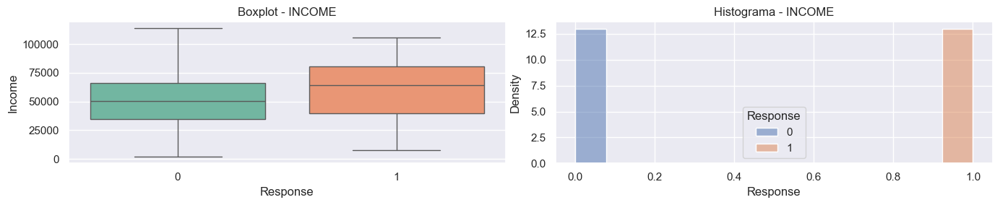



Feature: Kidhome


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,0.46,0.54,0.0,0.0,0.0,1.0,2.0
1,333.0,0.34,0.49,0.0,0.0,0.0,1.0,2.0


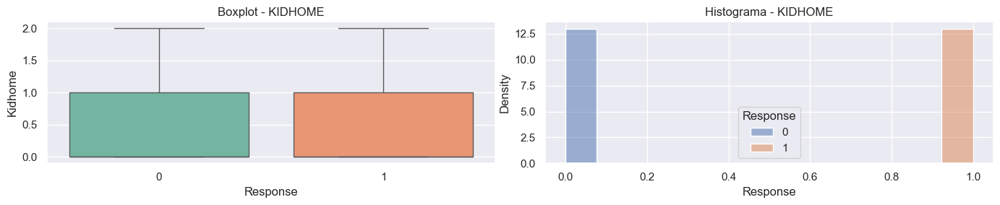



Feature: Teenhome


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,0.54,0.55,0.0,0.0,1.0,1.0,2.0
1,333.0,0.31,0.49,0.0,0.0,0.0,1.0,2.0


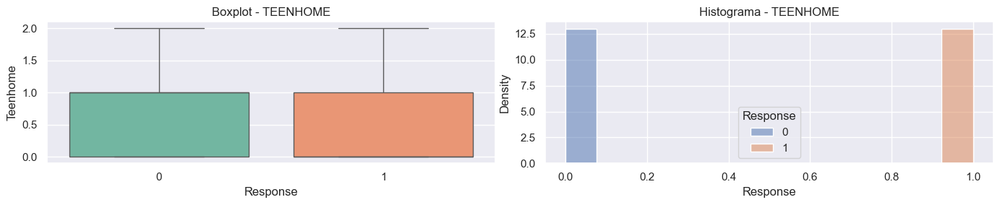



Feature: number_of_kids


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,1.00,0.74,0.0,1.0,1.0,1.0,3.0
1,333.0,0.65,0.74,0.0,0.0,0.0,1.0,3.0


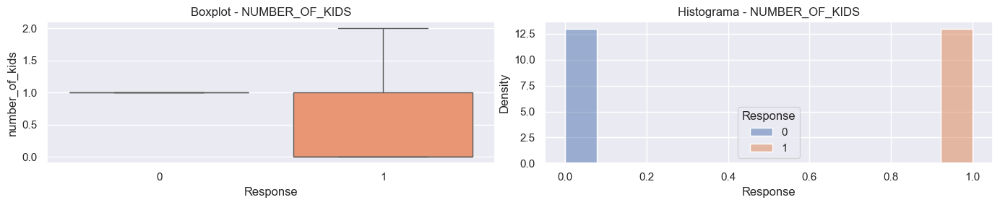



Feature: Recency


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,51.44,28.50,0.0,27.0,52.0,76.5,99.0
1,333.0,35.26,27.62,0.0,11.0,30.0,56.0,99.0


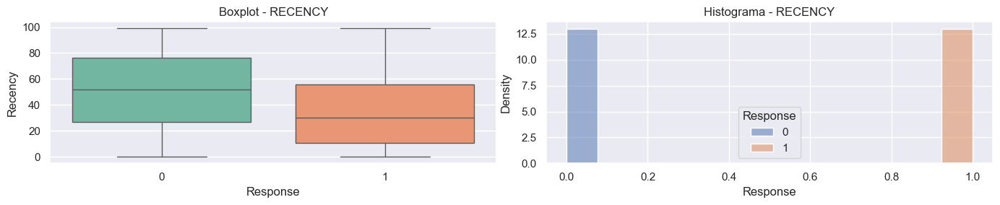



Feature: MntWines


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,270.16,305.80,0.0,21.5,153.0,445.0,1493.0
1,333.0,502.62,427.82,1.0,96.0,448.0,882.0,1492.0


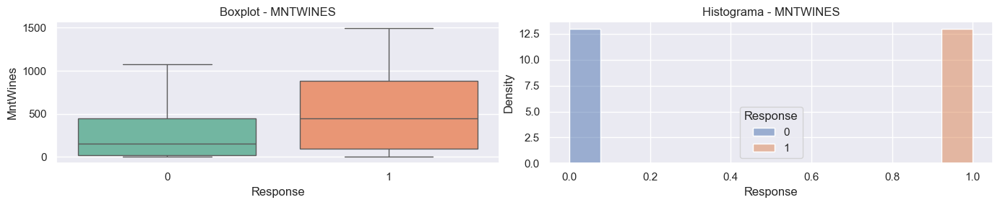



Feature: MntFruits


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,24.31,38.26,0.0,1.0,7.0,28.5,199.0
1,333.0,37.94,45.92,0.0,4.0,21.0,53.0,193.0


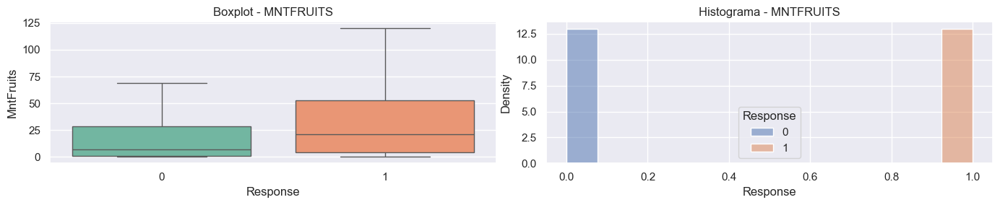



Feature: MntMeatProducts


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,144.58,203.26,0.0,14.0,56.0,194.0,1725.0
1,333.0,293.77,287.12,1.0,47.0,170.0,512.0,981.0


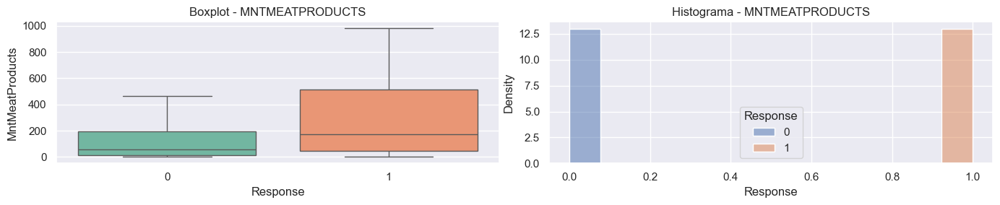



Feature: MntFishProducts


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,35.15,53.07,0.0,2.0,11.0,43.0,259.0
1,333.0,51.71,61.64,0.0,4.0,25.0,82.0,250.0


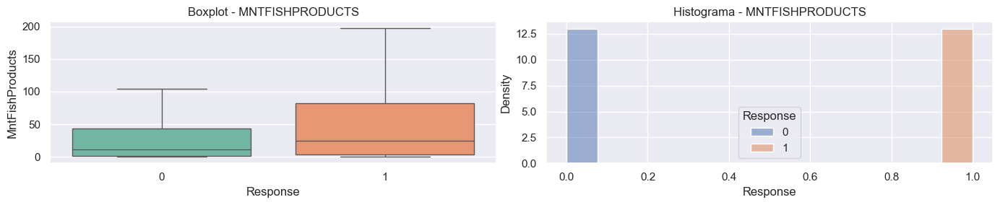



Feature: MntSweetProducts


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,25.02,39.79,0.0,1.0,7.0,30.0,262.0
1,333.0,38.37,46.15,0.0,3.0,20.0,57.0,198.0


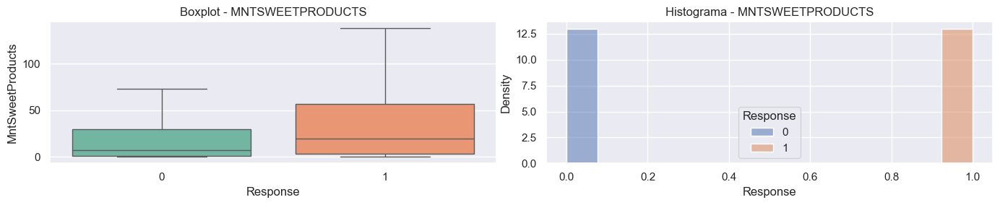



Feature: MntGoldProds


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,40.91,50.15,0.0,7.0,21.0,53.0,321.0
1,333.0,61.25,57.48,0.0,20.0,39.0,84.0,245.0


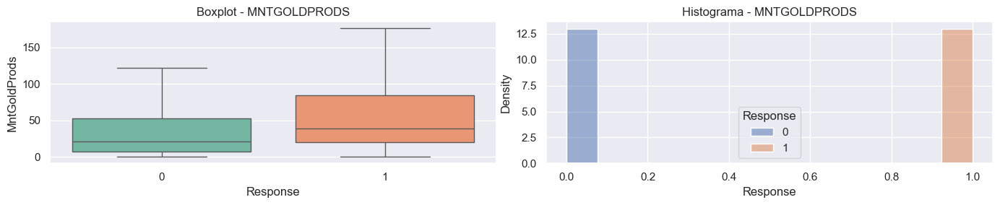



Feature: total_amount_spent_2y


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,540.12,553.77,5.0,62.0,315.0,958.5,2525.0
1,333.0,985.66,719.39,17.0,252.0,1053.0,1617.0,2525.0


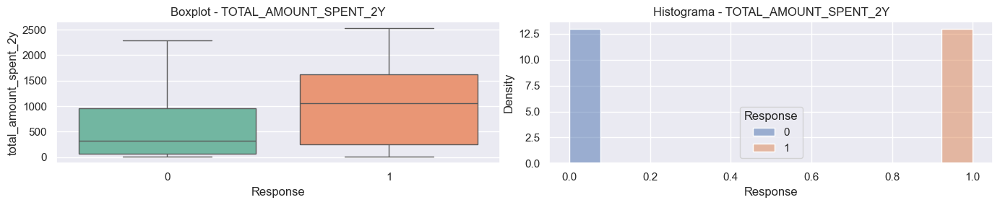



Feature: NumCatalogPurchases


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,2.4,2.80,0.0,0.0,1.0,4.0,28.0
1,333.0,4.2,3.14,0.0,1.0,4.0,6.0,11.0


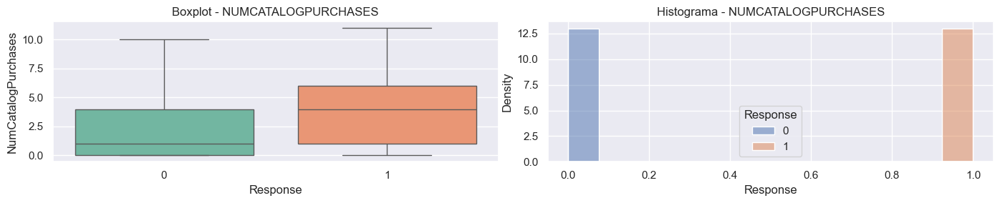



Feature: NumStorePurchases


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,5.75,3.28,0.0,3.0,5.0,8.0,13.0
1,333.0,6.08,3.07,2.0,4.0,6.0,8.0,13.0


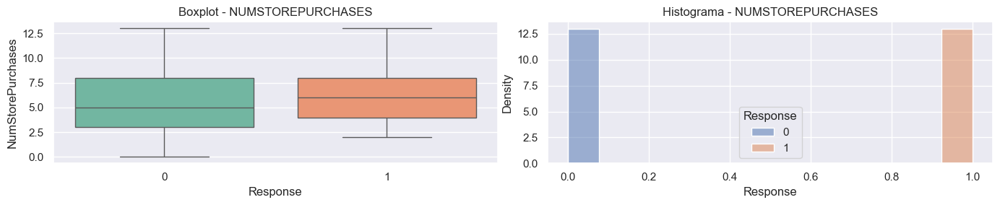



Feature: NumWebPurchases


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,3.91,2.74,0.0,2.0,3.0,6.0,27.0
1,333.0,5.07,2.56,0.0,3.0,5.0,7.0,11.0


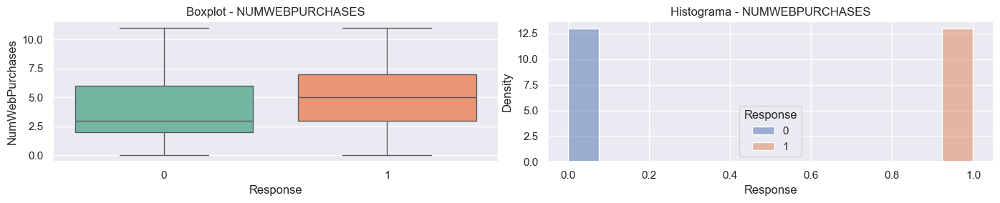



Feature: total_sales_channel_purchases


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,12.06,7.16,0.0,5.0,11.0,18.0,32.0
1,333.0,15.35,6.83,3.0,10.0,16.0,21.0,32.0


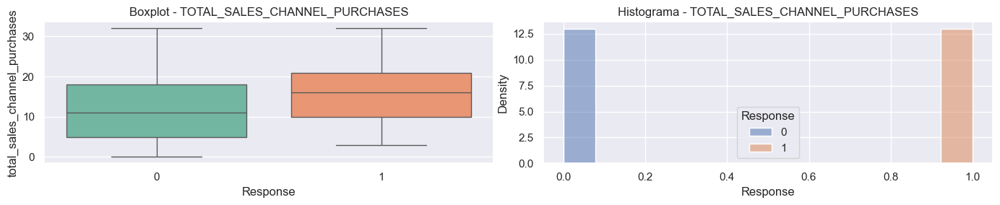



Feature: NumDealsPurchases


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,2.32,1.89,0.0,1.0,2.0,3.0,15.0
1,333.0,2.34,2.11,0.0,1.0,1.0,3.0,11.0


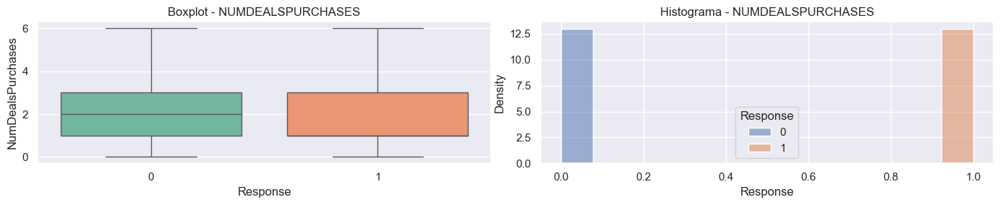



Feature: NumWebVisitsMonth


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,5.32,2.40,0.0,4.0,6.0,7.0,20.0
1,333.0,5.31,2.56,1.0,3.0,6.0,8.0,10.0


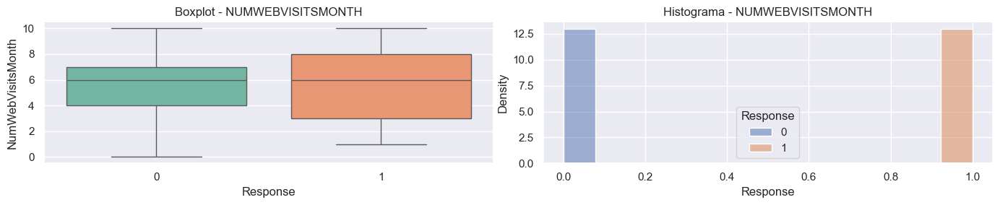

In [46]:
for column in numeric_columns:
    
    print('Feature: ' + column)
    
    # Generate descriptive statistics
    display(df_analysis_data.groupby('Response')[column].describe().round(2))
    
    plt.figure(figsize=(14, 3)) 
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Response', y=column, data=df_analysis_data, palette='Set2', showfliers=False)
    plt.title(f'Boxplot - {column.upper()}')

    plt.subplot(1, 2, 2)
    sns.histplot(data=df_analysis_data, x='Response', hue='Response', kde=True, stat='density', common_norm=False)
    plt.title(f'Histograma - {column.upper()}')
    plt.tight_layout()
    plt.show()  

    
    print("\n")

### Insights

In [47]:
# Describing the main differences and insights we obtained.
# After the manual analysis, we will employ additional techniques, such as statistical methods, to validate the features.

#### Numeric features

| Feature |     Analysis    |     Good for prediction?    |
|:---------:|:----------------:|:------------:|
| Income | Similar profiles. The classes have similar variance. Does not make good predictions. | No |
| Kidhome | Similar profiles. The classes have similar variance. Does not make good predictions. | No |
| Teenhome | More than 50% of the target group is likely to have no teenage residents in their homes. The classes have similar variance. At least 50% of the non-target group is likely to have at least 1 teenhome. | Maybe |
| number_of_kids | In general, non-targets are more likely to have 1 kid. The profile of the target group is more variable, with its 25th percentile having 0 children and its 75th percentile having 1 child.. | Maybe |
| Recency | Targets are, in general, more likely to purchase products more recently. The classes have similar variance. | Yes |
| MntWines | Targets are, in general, more likely to spend more in wines. There is a considerable number of customers who spend a small amount of money in wines. | Yes |
| MntFruits | Targets are, in general, more likely to spend more in fruits. There is a considerable number of customers who spend a small amount of money in fruits. | Yes |
| MntMeatProducts | Targets are, in general, more likely to spend more in meat. There is a considerable number of customers who spend a small amount of money in meat. | Yes |
| MntFishProducts | Targets are, in general, more likely to spend more in fish. There is a considerable number of customers who spend a small amount of money in fish. | Yes |
| MntSweetProducts | Targets are, in general, more likely to spend more in sweet products. There is a considerable number of customers who spend a small amount of money in sweet products. | Yes |
| MntGoldProds | Targets are, in general, more likely to spend more in gold products. The 25th percentile of the target group is equal to the value at the 50th percentile of the non-target group. | Yes |
| total_amount_spent_2y | Targets are, in general, more likely to spend more in all products. The target group has bigger variance then the non-target group. | Very good predictor |
| NumCatalogPurchases | Targets are, in general, more likely to purchase products by catalogs. The classes have similar variance. | Yes |
| NumStorePurchases | Targets and non-targets have the similar behavior when we look at the store's purchases. Non-targets have more variable variance then targets. | No |
| NumWebPurchases | Targets are, in general, more likely to purchase products by websites. The classes have similar variance. | Yes |
| total_sales_channel_purchases | Targets are, in general, more likely to buy more. The classes have similar variance. | Yes |
| NumDealsPurchases | Non-targets are, in general, more likely to ask for a discount. | Yes |
| NumWebVisitsMonth | Similar profiles. Targets have more variable variance then non-targets. | No |
| Z_CostContact | Same profile. | No |
| Z_Revenue | Same profile. | No |

### Explore new numeric features

In [48]:
# Based on the main features, I've come up with some ideas to enhance our understanding of the customers. 
# In this Notebook, every time we generate ideas for new features, we will validate their predictive power to distinguish between groups.

In [49]:
# Creating a function to automate the generation of descriptive statistics.

def numeric_feature(df, column):  

    # Generate descriptive statistics
    display(df.groupby('Response')[column].describe().round(2))

    # Tamanho da figura:
    plt.figure(figsize=(14, 3)) 
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Response', y=column, hue='Response', data=df, palette='Set2', showfliers=False)
    plt.title(f'Boxplot - {column.upper()}')

    plt.subplot(1, 2, 2)
    sns.histplot(data=df, x=column, hue='Response', kde=True, stat='density', palette='Set2', common_norm=False, legend=True)
    plt.title(f'Histograma - {column.upper()}')
    plt.tight_layout()
    plt.show()  

#### 1st try: discount_rate

In [50]:
df_analysis_data['discount_rate'] = df_analysis_data['NumDealsPurchases']*100 / df_analysis_data['total_sales_channel_purchases'] 

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1879.0,inf,NaN,0.0,10.00,22.22,33.33,inf
1,333.0,20.75,18.97,0.0,5.26,12.50,37.50,71.43


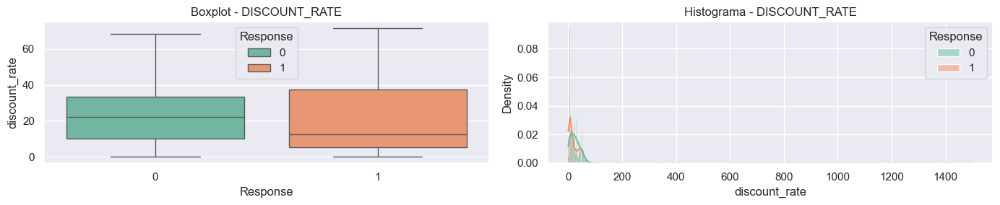

In [51]:
numeric_feature(df_analysis_data, 'discount_rate')

In [52]:
# Bad for prediction. 
# It can have infinite values, probably because total_sales_channel_purchases can be 0.
# When total_sales_channel_purchases = 0, discount_rate -> inf

In [53]:
# Validate total_sales_channel_purchases distribution
df_analysis_data.groupby('Response')['total_sales_channel_purchases'].describe()

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,12.062666,7.157504,0.0,5.0,11.0,18.0,32.0
1,333.0,15.354354,6.831048,3.0,10.0,16.0,21.0,32.0


#### 2nd try: gold_products_amount_rate

In [54]:
# Generate the percentage spent on gold products

df_analysis_data['gold_products_amount_rate'] = df_analysis_data['MntGoldProds']*100 / df_analysis_data['total_amount_spent_2y'] 

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,12.04,10.64,0.0,4.02,8.87,17.24,89.42
1,333.0,11.88,12.22,0.0,2.90,7.29,16.33,48.15


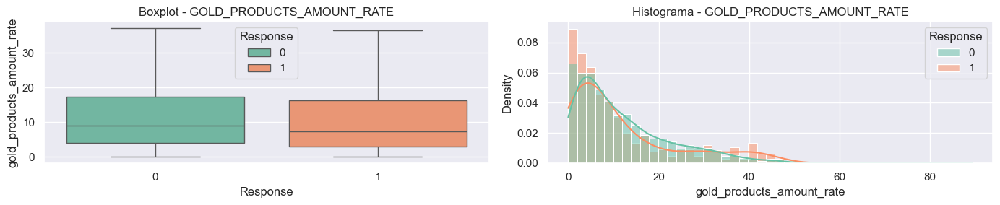

In [55]:
numeric_feature(df_analysis_data, 'gold_products_amount_rate')

In [56]:
# Bad for prediction. 
# The distribution of classes is very similar.

## Date features

### Original data: Overview 

In [57]:
df_analysis_data.head(3)

# Year_Birth: Year
# Dt_Customer: Date

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,0,776,20,0,5.000000,5.412371


In [58]:
df_analysis_data['Dt_Customer'] = pd.to_datetime(df_analysis_data['Dt_Customer'])

In [59]:
# Creating a different visualization of the date column. 
# Perhaps, we can identify a specific month or year when most of the target customers enrolled with the company.

df_analysis_data['year_Customer'] = df_analysis_data['Dt_Customer'].dt.year
df_analysis_data['month_Customer'] = df_analysis_data['Dt_Customer'].dt.month
df_analysis_data['month_year_Customer'] = df_analysis_data['Dt_Customer'].dt.to_period('M')

In [60]:
# List columns
date_columns = ['year_Customer','month_Customer']

In [61]:
# for column in date_columns:
#     print('Feature: ' + column)

#     # Generate descriptive statistics    
#     print('Normalizing feature by its index:')
#     display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='index').round(2))
#     print('Normalizing feature by its columns:')
#     display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='columns').round(2))

#     # Plot countplot
#     plt.figure(figsize=(12, 2))
#     sns.countplot(data=df_analysis_data, hue='Response', x=column)
#     plt.title('Barplot for ' + column)
#     plt.show()
#     plt.close()
    
#     print("\n")

In [62]:
# They don't appear to be good predictors.

### Feature Engineering: create new Date features

#### Data understanding

In [63]:
# Max values
df_analysis_data.Year_Birth.max()

np.int64(1996)

In [64]:
# Max values
df_analysis_data.Dt_Customer.max()

Timestamp('2014-06-29 00:00:00')

#### Create continuous features for both

In [65]:
from datetime import date, datetime

# If we consider the analysis date as the reference_date, Customer_age will be too high. 
# This could provide us with incorrect insights about the customer's profile. 
# However, since we don't have a reference date that indicates the data's extraction, we will first transform the date columns into continuous features. 
# We will need to correct those afterwards

today_date = date.today()
reference_datetime = datetime.combine(today_date, datetime.min.time())

reference_datetime

datetime.datetime(2024, 10, 4, 0, 0)

In [66]:
# Year from reference_datetime

reference_year = today_date.year 
reference_year

2024

#### Making Dt_Customer continuous

In [67]:
# How many days have passed since the customer's enrollment?

df_analysis_data['days_since_enrollment'] = (reference_datetime - df_analysis_data['Dt_Customer']).dt.days

In [68]:
df_analysis_data[['Dt_Customer','days_since_enrollment']].head(3)

,Dt_Customer,days_since_enrollment
0,2012-09-04,4413
1,2014-03-08,3863
2,2013-08-21,4062


#### Making Year_Birth continuous

In [69]:
# How many days have passed since the customer's birth?

df_analysis_data['Customers_age'] = (reference_year - df_analysis_data['Year_Birth'])

In [70]:
df_analysis_data[['Year_Birth','Customers_age']].head(3)

,Year_Birth,Customers_age
0,1957,67
1,1954,70
2,1965,59


#### Making days_since_enrollment & Customers_age generic 

In [71]:
# It's important to make it generic if we want to use historical data to predict behaviors in new data. 
# If we intend to deploy the predictive model to production, the data needs to follow the same pattern as the data used to train the model

##### Start with days_since_enrollment

In [72]:
df_analysis_data.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177,2012,9,2012-09,4413,67
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222,2014,3,2014-03,3863,70
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,0,776,20,0,5.000000,5.412371,2013,8,2013-08,4062,59


In [73]:
# The last customer enrollment was in 2014. 
# Probably, the dataset extraction happened a long time ago:

df_analysis_data.Dt_Customer.max()

Timestamp('2014-06-29 00:00:00')

In [74]:
df_analysis_data.days_since_enrollment.min()

np.int64(3750)

In [75]:
df_analysis_data[['Dt_Customer','days_since_enrollment']].sort_values(by='Dt_Customer', ascending=False).head(5)

,Dt_Customer,days_since_enrollment
989,2014-06-29,3750
200,2014-06-29,3750
1812,2014-06-28,3751
796,2014-06-28,3751
45,2014-06-28,3751


In [76]:
# Create a new feature that doesn't depend on the reference date. 
# It represents the order based on the maximum Dt_Customer.

df_analysis_data['enrollment_order'] = df_analysis_data['days_since_enrollment'] - (df_analysis_data.days_since_enrollment.min())

In [77]:
# Data validation
df_analysis_data[['Dt_Customer','days_since_enrollment','enrollment_order']].sort_values(by='Dt_Customer', ascending=False).head(5)

,Dt_Customer,days_since_enrollment,enrollment_order
989,2014-06-29,3750,0
200,2014-06-29,3750,0
1812,2014-06-28,3751,1
796,2014-06-28,3751,1
45,2014-06-28,3751,1


##### Making the same with Customers_age

In [78]:
df_analysis_data.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177,2012,9,2012-09,4413,67,663
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222,2014,3,2014-03,3863,70,113
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,0,776,20,0,5.000000,5.412371,2013,8,2013-08,4062,59,312


In [79]:
# The customer's last birth was in 1996

df_analysis_data.Year_Birth.max()

np.int64(1996)

In [80]:
# The youngest customer is 28 years old

df_analysis_data.Customers_age.min()

np.int64(28)

In [81]:
df_analysis_data[['Year_Birth','Customers_age']].sort_values(by='Customers_age', ascending=True).head(5)

,Year_Birth,Customers_age
1170,1996,28
46,1996,28
995,1995,29
747,1995,29
1850,1995,29


In [82]:
# Create a new feature that doesn't depend on the reference date. 
# It represents the order based on the minimum Customers_age.

df_analysis_data['age_order'] = df_analysis_data['Customers_age'] - (df_analysis_data.Customers_age.min())

In [83]:
# Data validation
df_analysis_data[['Year_Birth','Customers_age','age_order']].sort_values(by='Customers_age', ascending=True).head(3)

,Year_Birth,Customers_age,age_order
1170,1996,28,0
46,1996,28,0
995,1995,29,1


#### Evaluate new date features

In [84]:
new_date_columns = ['days_since_enrollment','enrollment_order','Customers_age','age_order']

Feature: days_since_enrollment


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,4086.80,198.90,3750.0,3912.5,4081.0,4251.0,4448.0
1,333.0,4198.08,196.47,3756.0,4063.0,4242.0,4371.0,4449.0


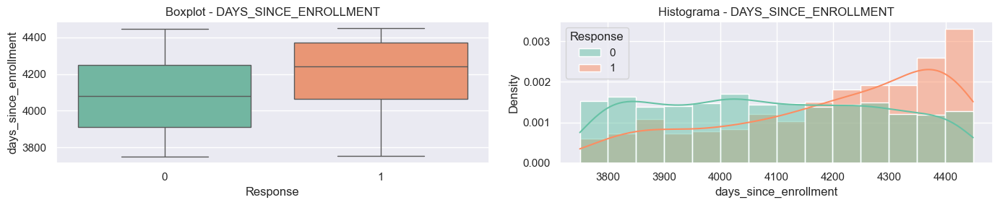



Feature: enrollment_order


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,336.80,198.90,0.0,162.5,331.0,501.0,698.0
1,333.0,448.08,196.47,6.0,313.0,492.0,621.0,699.0


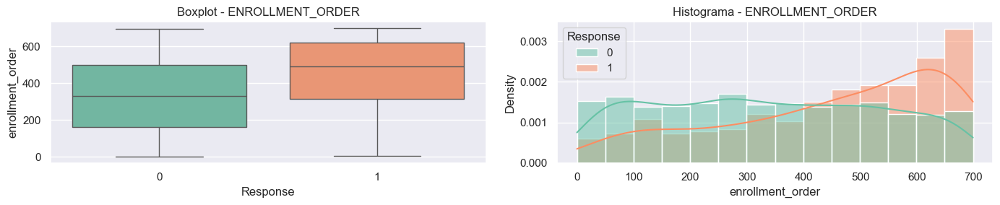



Feature: Customers_age


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,55.3,11.92,28.0,47.0,54.0,65.0,131.0
1,333.0,54.5,12.33,28.0,45.0,53.0,65.0,81.0


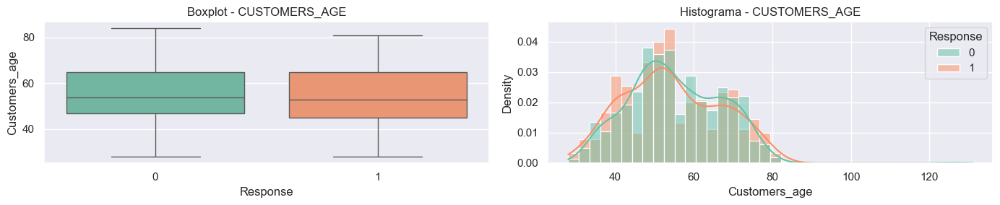



Feature: age_order


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,27.3,11.92,0.0,19.0,26.0,37.0,103.0
1,333.0,26.5,12.33,0.0,17.0,25.0,37.0,53.0


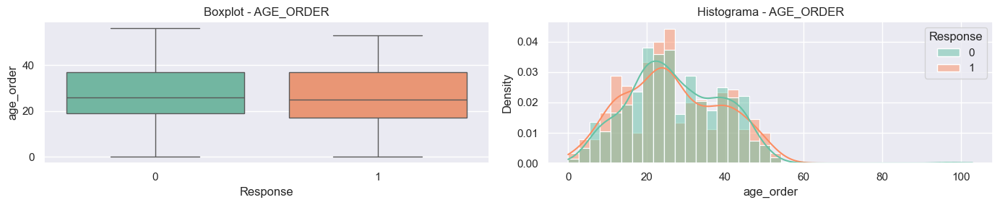

In [85]:
# Now, let's check if the new date columns correspond to the distribution of the original data.
# Yes, it does!

for column in new_date_columns:
    
    print('Feature: ' + column)
    
    # Generate descriptive statistics
    display(df_analysis_data.groupby('Response')[column].describe().round(2))

    # Tamanho da figura:
    plt.figure(figsize=(14, 3)) 
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Response', y=column, data=df_analysis_data, palette='Set2', showfliers=False)
    plt.title(f'Boxplot - {column.upper()}')

    plt.subplot(1, 2, 2)
    sns.histplot(data=df_analysis_data, x=column, hue='Response', kde=True, stat='density', palette='Set2', common_norm=False)
    plt.title(f'Histograma - {column.upper()}')
    plt.tight_layout()
    plt.show()  

    
    print("\n")

### Insights

#### Date features

| Feature |     Analysis    |     Good for prediction?    |
|:---------:|:----------------:|:------------:|
| days_since_enrollment/enrollment_order | In general, the target group is enrolled with the company for more time than non-targets. | Yes |
| Customers_ag/age_ordere | Similar profiles. The classes have similar variance. Does not make good predictions | No |

## Categorical features

### Original data: Overview 

In [86]:
# Working with categorical data can be very tricky. 
# When there are too many entries, it's interesting to transform them into numeric data. 
# First of all, let's examine the distribution of the original data.

In [87]:
categorical_columns = ['Education','Marital_Status']

Feature: Education
Normalizing feature by its index:


Response,0,1
Education,,
2n Cycle,0.89,0.11
Basic,0.96,0.04
Graduation,0.86,0.14
Master,0.85,0.15
PhD,0.79,0.21


Normalizing feature by its columns:


Response,0,1
Education,,
2n Cycle,0.09,0.07
Basic,0.03,0.01
Graduation,0.51,0.46
Master,0.16,0.17
PhD,0.20,0.30


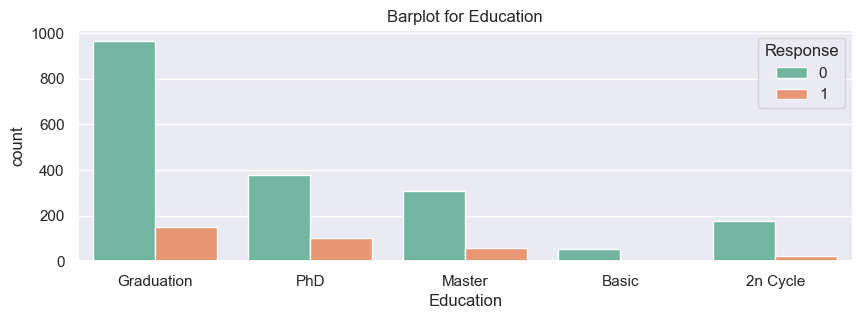



Feature: Marital_Status
Normalizing feature by its index:


Response,0,1
Marital_Status,,
Absurd,0.50,0.50
Alone,0.67,0.33
Divorced,0.79,0.21
Married,0.89,0.11
Single,0.77,0.23
Together,0.90,0.10
Widow,0.76,0.24
YOLO,0.50,0.50


Normalizing feature by its columns:


Response,0,1
Marital_Status,,
Absurd,0.00,0.00
Alone,0.00,0.00
Divorced,0.10,0.14
Married,0.40,0.29
Single,0.19,0.32
Together,0.27,0.18
Widow,0.03,0.05
YOLO,0.00,0.00


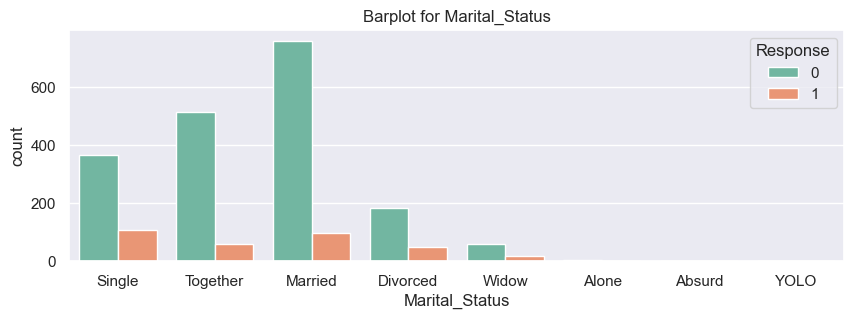

In [88]:
for column in categorical_columns:
    
    print('Feature: ' + column)

    # Generate descriptive statistics    
    print('Normalizing feature by its index:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='index').round(2))
    print('Normalizing feature by its columns:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='columns').round(2))

    # Plot countplot
    plt.figure(figsize=(10, 3))
    sns.countplot(data=df_analysis_data, hue='Response', x=column, palette='Set2')
    plt.title('Barplot for ' + column)
    plt.show()
    
    print("\n")

### Feature Engineering: create new Categorical features

#### Education

##### The educational progression in order:
0. 2n Cycle
1. Basic
2. Graduation
3. Master
4. PhD

In [89]:
# Create a categorical feature, but reduce the number of entries.

df_analysis_data['education_level'] = ''

df_analysis_data.loc[df_analysis_data['Education'].isin(['Basic','2n Cycle']), 'education_level'] = 'Low'

df_analysis_data.loc[df_analysis_data['Education'] == 'Graduation', 'education_level'] = 'Medium'

df_analysis_data.loc[df_analysis_data['Education'].isin(['Master','PhD']), 'education_level'] = 'High'

In [90]:
# Validation
df_analysis_data.groupby(['education_level','Education']).ID.nunique().reset_index()

,education_level,Education,ID
0,High,Master,365
1,High,PhD,481
2,Low,2n Cycle,200
3,Low,Basic,54
4,Medium,Graduation,1116


In [91]:
# Create a numeric feature based on the education level

df_analysis_data['education_order_level'] = ''

df_analysis_data.loc[(df_analysis_data['Education'] == '2n Cycle'), 'education_order_level'] = 0
df_analysis_data.loc[(df_analysis_data['Education'] == 'Basic'), 'education_order_level'] = 1
df_analysis_data.loc[(df_analysis_data['Education'] == 'Graduation'), 'education_order_level'] = 2
df_analysis_data.loc[(df_analysis_data['Education'] == 'Master'), 'education_order_level'] = 3
df_analysis_data.loc[(df_analysis_data['Education'] == 'PhD'), 'education_order_level'] = 4

df_analysis_data['education_order_level'] = df_analysis_data['education_order_level'].astype('int64')

In [92]:
# Validation
df_analysis_data.groupby(['education_order_level','Education']).ID.nunique().reset_index()

,education_order_level,Education,ID
0,0,2n Cycle,200
1,1,Basic,54
2,2,Graduation,1116
3,3,Master,365
4,4,PhD,481


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,2.35,1.12,0.0,2.0,2.0,3.0,4.0
1,333.0,2.64,1.12,0.0,2.0,2.0,4.0,4.0


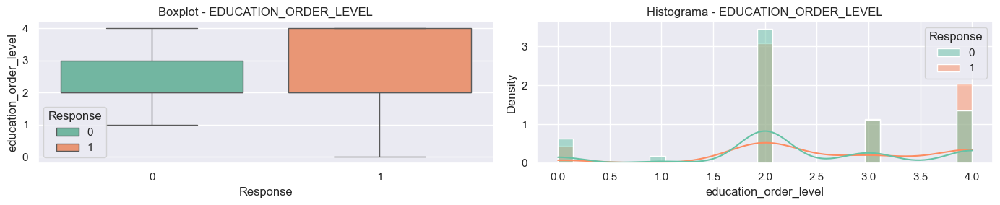

In [93]:
# How is the performance of the new numeric data?

numeric_feature(df_analysis_data, 'education_order_level')

#### Marital_Status

In [94]:
# First of all, let's understand the 'Marital_Status' entries. 
# 'YOLO' and 'Absurd' are not real marital status classifications.

df_analysis_data.groupby('Marital_Status').ID.nunique().reset_index().sort_values(by='ID').T

,0,7,1,6,2,4,5,3
Marital_Status,Absurd,YOLO,Alone,Widow,Divorced,Single,Together,Married
ID,2,2,3,76,232,471,573,857


In [95]:
# Transform the categorical data into binary data
df_analysis_data['customer_has_a_partner'] = 0

# Cases where the customer currently has a partner: either 'Together' or 'Married'
df_analysis_data.loc[df_analysis_data['Marital_Status'].isin(['Together','Married']), 'customer_has_a_partner'] = 1

In [96]:
# Validation
df_analysis_data.groupby(['customer_has_a_partner','Marital_Status']).ID.nunique().reset_index().sort_values(by='ID').T

,0,5,1,4,2,3,7,6
customer_has_a_partner,0,0,0,0,0,0,1,1
Marital_Status,Absurd,YOLO,Alone,Widow,Divorced,Single,Together,Married
ID,2,2,3,76,232,471,573,857


#### Evaluate new features

In [97]:
# Now, let's evaluate the performance of the new features

new_categorical_columns = ['education_level','customer_has_a_partner']

Feature: education_level
Normalizing feature by its index:


Response,0,1
education_level,,
High,0.81,0.19
Low,0.91,0.09
Medium,0.86,0.14


Normalizing feature by its columns:


Response,0,1
education_level,,
High,0.37,0.47
Low,0.12,0.07
Medium,0.51,0.46


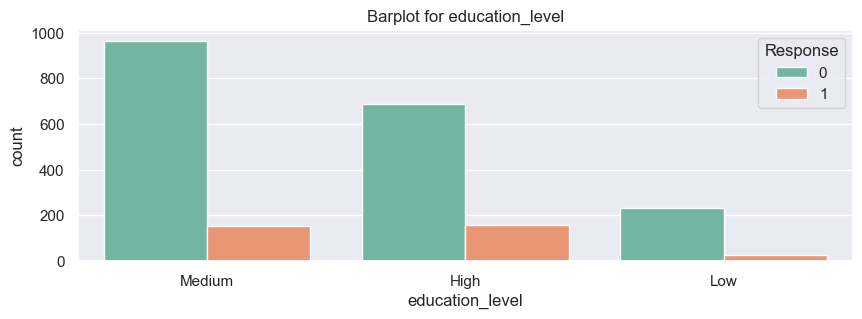



Feature: customer_has_a_partner
Normalizing feature by its index:


Response,0,1
customer_has_a_partner,,
0,0.78,0.22
1,0.89,0.11


Normalizing feature by its columns:


Response,0,1
customer_has_a_partner,,
0,0.32,0.53
1,0.68,0.47


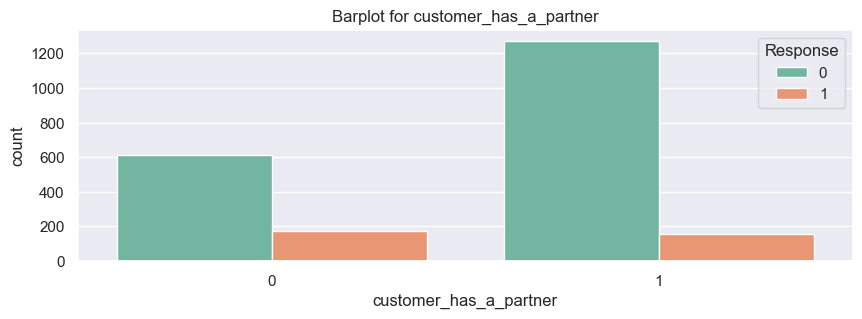

In [98]:
for column in new_categorical_columns:
    print('Feature: ' + column)

    # Generate descriptive statistics    
    print('Normalizing feature by its index:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='index').round(2))
    print('Normalizing feature by its columns:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='columns').round(2))

    # Plot countplot
    plt.figure(figsize=(10, 3))
    sns.countplot(data=df_analysis_data, hue='Response', x=column, palette='Set2')
    plt.title('Barplot for ' + column)
    plt.show()
    
    print("\n")

#### Create one more feature: number of people living in the house

In [99]:
# Both 'customer_has_a_partner' and 'number_of_kids' have moderate predictive power. 
# Let's explore combining them.

In [100]:
df_analysis_data['number_of_residents'] = 0

df_analysis_data.loc[(df_analysis_data['customer_has_a_partner'] == 1), 'number_of_residents'] = df_analysis_data['number_of_kids'] + 2 # two people

df_analysis_data.loc[(df_analysis_data['customer_has_a_partner'] == 0), 'number_of_residents'] = df_analysis_data['number_of_kids'] + 1 # only one person

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,2.68,0.87,1.0,2.0,3.0,3.0,5.0
1,333.0,2.12,0.94,1.0,1.0,2.0,3.0,5.0


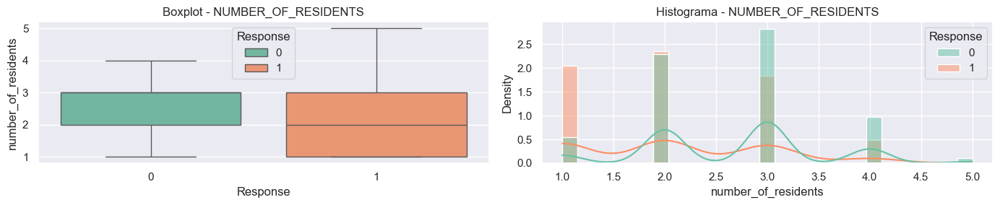

In [101]:
numeric_feature(df_analysis_data, 'number_of_residents')

### Insights

#### Categorical features

| Feature |     Analysis    |     Good for prediction?    |
|:---------:|:----------------:|:------------:|
| education_level | 47% of the target group have High education level, while 37% of the non-target group have it | Maybe |
| customer_has_a_partner |Similar profiles.  51% of the target group have a partner, while 33% of the non-target group have it.  | Maybe 
| number_of_residents | Similar profiles. The target group is more likely to have fewer people residing in the house. | Maybe ||

## Binary features

### Overview

In [102]:
# We have some columns indicating whether the customer accepted any other campaigns. 
# However, we don't have information on how those campaigns happened.

In [103]:
binary_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain']

In [104]:
for column in binary_columns:
    
    print('Feature: ' + column)

    # Generate descriptive statistics    
    print('Normalizing feature by its index:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='index').round(2))
    print('Normalizing feature by its columns:')
    display(pd.crosstab(df_analysis_data[column], df_analysis_data['Response'], normalize='columns').round(2))

    print("\n")

Feature: AcceptedCmp1
Normalizing feature by its index:


Response,0,1
AcceptedCmp1,,
0,0.88,0.12
1,0.44,0.56


Normalizing feature by its columns:


Response,0,1
AcceptedCmp1,,
0,0.97,0.76
1,0.03,0.24




Feature: AcceptedCmp2
Normalizing feature by its index:


Response,0,1
AcceptedCmp2,,
0,0.86,0.14
1,0.33,0.67


Normalizing feature by its columns:


Response,0,1
AcceptedCmp2,,
0,0.99,0.94
1,0.01,0.06




Feature: AcceptedCmp3
Normalizing feature by its index:


Response,0,1
AcceptedCmp3,,
0,0.88,0.12
1,0.53,0.47


Normalizing feature by its columns:


Response,0,1
AcceptedCmp3,,
0,0.95,0.77
1,0.05,0.23




Feature: AcceptedCmp4
Normalizing feature by its index:


Response,0,1
AcceptedCmp4,,
0,0.87,0.13
1,0.62,0.38


Normalizing feature by its columns:


Response,0,1
AcceptedCmp4,,
0,0.95,0.81
1,0.05,0.19




Feature: AcceptedCmp5
Normalizing feature by its index:


Response,0,1
AcceptedCmp5,,
0,0.88,0.12
1,0.44,0.56


Normalizing feature by its columns:


Response,0,1
AcceptedCmp5,,
0,0.96,0.73
1,0.04,0.27




Feature: Complain
Normalizing feature by its index:


Response,0,1
Complain,,
0,0.85,0.15
1,0.86,0.14


Normalizing feature by its columns:


Response,0,1
Complain,,
0,0.99,0.99
1,0.01,0.01


### Insights

#### Binary features

| Feature |     Analysis    |     Good for prediction?    |
|:---------:|:----------------:|:------------:|
| AcceptedCmp1 | Among all those who accepted the 1st offer, 54% belonged to the target group, while 46% were from the non-target group; 23% of the target group accepted the 1st offer, while 3% of the non-target group accepted the 1st offer. | Yes |
| AcceptedCmp2 | Among all those who accepted the 2nd offer, 62% belonged to the target group, while 38% were from the non-target group; Only 6% of the target group accepted the  2nd offer, while only 1% of the non-target group accepted the 1st offer. | No |
| AcceptedCmp3 | Among all those who accepted the 3rd offer, 47% belonged to the target group, while 53% were from the non-target group; 25% of the target group accepted the  3rd offer, while only 5% of the non-target group accepted the 1st offer. | Yes |
| AcceptedCmp4 | Among all those who accepted the 4th offer, 37% belonged to the target group, while 63% were from the non-target group; 18% of the target group accepted the 4th offer, while only 5% of the non-target group accepted the 1st offer. | Maybe |
| AcceptedCmp5 | Among all those who accepted the 5th offer, 54% belonged to the target group, while 46% were from the non-target group; 27% of the target group accepted the 5th offer, while only 4% of the non-target group accepted the 1st offer. | Yes |
| Complain | Among all those who complained, 16% belonged to the target group, while 84% were from the non-target group; Only 1% from each group complained in the last 2 years | Yes |Yes |

## More features, based on what we have created so far

In [105]:
# By now, we have analyzed all available features. 
# We can understand some things about our audience, but we want more.

# Based on the type of product and the customer's profile, we can create additional information. 
# In this section, we will do more Feature Engineering

In [106]:
df_analysis_data.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177,2012,9,2012-09,4413,67,663,39,Medium,2,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222,2014,3,2014-03,3863,70,113,42,Medium,2,0,3


### income_per_people_in_the_house

In [107]:
# The customer's income must be used to feed all people in the house

df_analysis_data['income_per_people_in_the_house'] = df_analysis_data['Income']/df_analysis_data['number_of_residents']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,22640.29,17239.69,815.67,11714.38,17841.0,28407.25,222222.0
1,333.0,38297.46,27540.61,2500.00,14054.00,31560.0,58138.00,102692.0


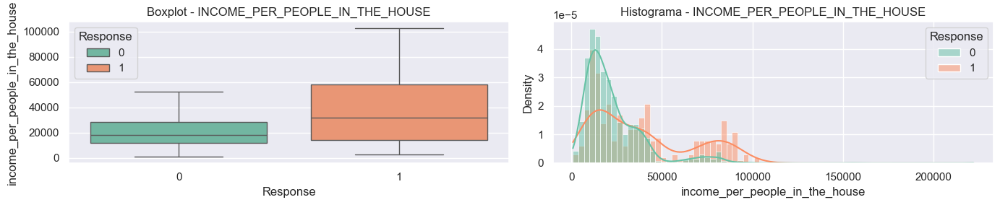

In [108]:
numeric_feature(df_analysis_data, 'income_per_people_in_the_house') # Good predictor

### percentage_income_spent_on_products

In [109]:
# From 0% to 100%, how much of the customer's income was spent on the company?

df_analysis_data['percentage_income_spent_on_products'] = df_analysis_data['total_amount_spent_2y']*100/df_analysis_data['Income']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1883.0,0.92,1.78,0.00,0.21,0.69,1.43,70.70
1,333.0,1.42,0.83,0.05,0.65,1.53,2.08,3.28


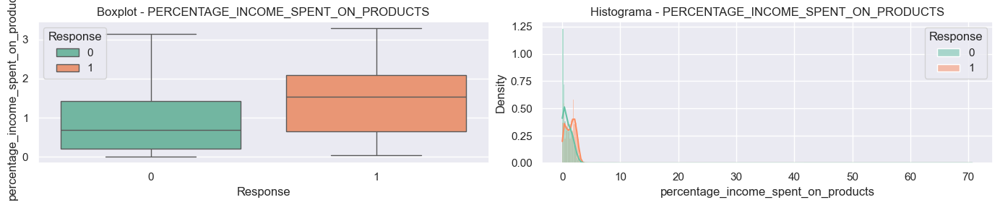

In [110]:
numeric_feature(df_analysis_data, 'percentage_income_spent_on_products') # Maybe it can be a good predictor

In [111]:
# Who are the outliers? Let's delve deeper

df_analysis_data.sort_values(by='percentage_income_spent_on_products', ascending=False).head(3)

# The outlier (ID 5376) bought a significant amount of meat, but he has a very low income
# The total database's median income is 51381.5, with a minimum of 1730
# His 'income per person in the house' is 815, lower than the lowest value in the group (as seen in the cell below)
# Additionally, spending 70% of the total income on just one company is an uncommon behavior

# It appears to be an outlier that we want to exclude. 
# Decision: Drop the ID from the dataset.

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products
21,5376,1979,Graduation,Married,2447.0,1,0,2013-01-06,42,1,1,1725,1,1,1,15,0,28,0,1,0,0,0,0,0,0,0,0,1730,28,1,53.571429,0.057803,2013,1,2013-01,4289,45,539,17,Medium,2,1,3,815.666667,70.698815
1975,10311,1969,Graduation,Married,4428.0,0,1,2013-10-05,0,16,4,12,2,4,321,0,25,0,0,1,0,0,0,0,0,0,0,0,359,25,1,0.000000,89.415042,2013,10,2013-10,4017,55,267,27,Medium,2,1,3,1476.000000,8.107498
1806,6237,1966,PhD,Single,7144.0,0,2,2013-12-07,92,81,4,33,5,2,291,0,23,1,1,0,0,0,0,0,0,0,0,0,416,25,2,0.000000,69.951923,2013,12,2013-12,3954,58,204,30,High,4,0,3,2381.333333,5.823068


In [112]:
quantiles = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
df_analysis_data.groupby('Response')['income_per_people_in_the_house'].quantile(quantiles).unstack().round(2)

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
Response,,,,,,,,,,,,,,,,,,,,,
0,815.67,6713.05,8148.6,9439.50,10639.50,11714.38,12787.00,13706.28,14965.65,16147.35,17841.0,19279.55,20935.67,22780.1,24986.1,28407.25,32677.6,36028.6,40286.5,62127.0,222222.0
1,2500.00,7926.70,10653.1,11938.73,12875.92,14054.00,16012.57,19286.00,21596.00,26029.60,31560.0,35257.10,39214.50,41272.0,45778.2,58138.00,72195.6,78621.0,83768.8,88211.8,102692.0


In [113]:
# Decision: drop the ID from the dataset.
df_analysis_data = df_analysis_data.drop(df_analysis_data[df_analysis_data['ID'] == 5376].index)

In [114]:
# Validation:
df_analysis_data.sort_values(by='percentage_income_spent_on_products', ascending=False).head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products
1975,10311,1969,Graduation,Married,4428.0,0,1,2013-10-05,0,16,4,12,2,4,321,0,25,0,0,1,0,0,0,0,0,0,0,0,359,25,1,0.0,89.415042,2013,10,2013-10,4017,55,267,27,Medium,2,1,3,1476.000000,8.107498
1806,6237,1966,PhD,Single,7144.0,0,2,2013-12-07,92,81,4,33,5,2,291,0,23,1,1,0,0,0,0,0,0,0,0,0,416,25,2,0.0,69.951923,2013,12,2013-12,3954,58,204,30,High,4,0,3,2381.333333,5.823068
1328,4246,1982,Master,Single,6560.0,0,0,2013-12-12,2,67,11,26,4,3,262,0,1,0,1,17,0,0,0,0,0,0,0,0,373,2,0,0.0,70.241287,2013,12,2013-12,3949,42,199,14,High,3,0,1,6560.000000,5.685976


,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,0.88,0.76,0.00,0.21,0.69,1.43,8.11
1,333.0,1.42,0.83,0.05,0.65,1.53,2.08,3.28


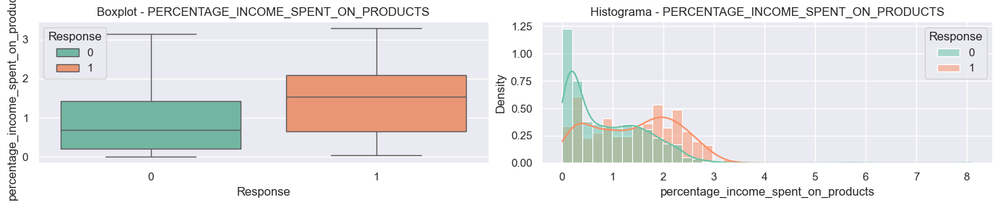

In [115]:
# See the plot difference after dropping the outlier
numeric_feature(df_analysis_data, 'percentage_income_spent_on_products') 

### amount_spent_on_wine_per_adult

In [116]:
# Keep going with the feature engineering. 
# We know that underage people are not allowed to drink alcohol. 
# It seems fair to consider that all purchased wine is used by adults

In [117]:
df_analysis_data.head(2)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177,2012,9,2012-09,4413,67,663,39,Medium,2,0,1,58138.0,2.781313
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222,2014,3,2014-03,3863,70,113,42,Medium,2,0,3,15448.0,0.058260


In [118]:
df_analysis_data['adults_count'] = 0

df_analysis_data.loc[(df_analysis_data['customer_has_a_partner'] == 1), 'adults_count'] = 2
df_analysis_data.loc[(df_analysis_data['customer_has_a_partner'] == 0), 'adults_count'] = 1

In [119]:
df_analysis_data['amount_spent_on_wine_per_adult'] = df_analysis_data['MntWines']/df_analysis_data['adults_count']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,177.15,219.42,0.0,13.12,87.75,266.88,1288.0
1,333.0,377.91,349.50,0.5,76.50,292.00,555.50,1462.0


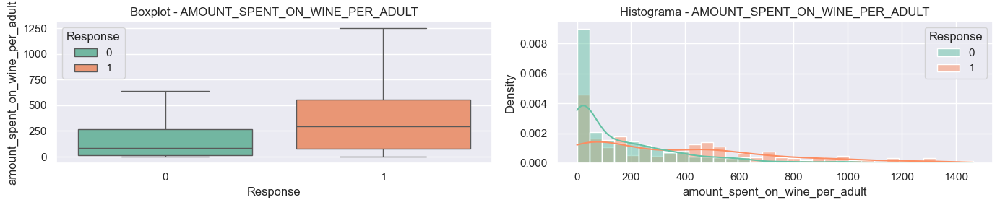

In [120]:
numeric_feature(df_analysis_data, 'amount_spent_on_wine_per_adult') 

### amount_spent_on_gold_per_adult

In [121]:
# We don't know for sure what a 'gold' product is. 
# It appears to be a premium product. 
# It seems fair to assume that all purchased 'gold' products are used by adults

In [122]:
df_analysis_data['amount_spent_on_gold_per_adult'] = df_analysis_data['MntGoldProds']/df_analysis_data['adults_count']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,27.19,36.70,0.0,4.5,13.0,34.5,291.0
1,333.0,46.63,47.57,0.0,13.5,32.0,64.0,245.0


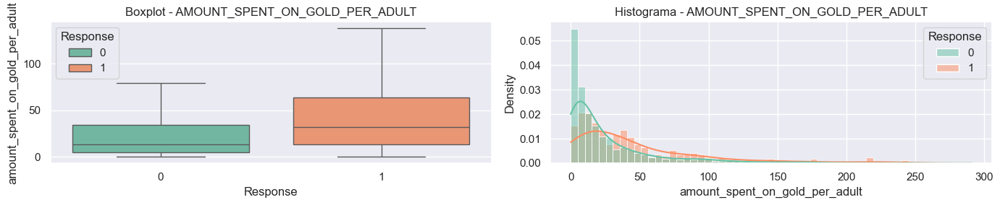

In [123]:
numeric_feature(df_analysis_data, 'amount_spent_on_gold_per_adult') 

### amount_spent_on_meat_per_person

In [124]:
# Different from wine, everyone can eat meat. 
# It seems fair to assume that all the purchased meat is divided among all the people living in the customer's house.

In [125]:
df_analysis_data['amount_spent_on_meat_per_person'] = df_analysis_data['MntMeatProducts']/df_analysis_data['number_of_residents']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,75.75,132.24,0.00,5.0,19.88,78.25,984.0
1,333.0,211.42,253.80,0.67,17.5,92.67,354.00,974.0


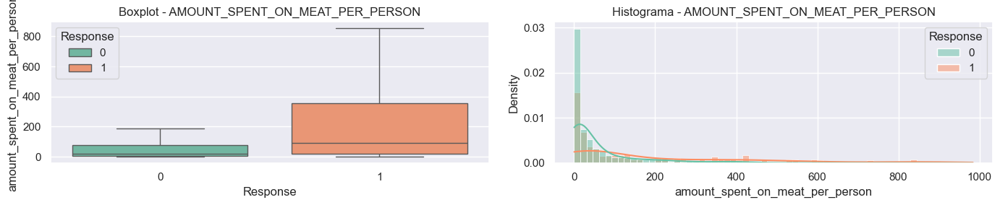

In [126]:
numeric_feature(df_analysis_data, 'amount_spent_on_meat_per_person') 

### amount_spent_on_fruits_per_person

In [127]:
# Just like meat, everyone can eat fruit. 
# It seems fair to assume that all the purchased fruit is divided among all the people living in the customer's house.

In [128]:
df_analysis_data['amount_spent_on_fruits_per_person'] = df_analysis_data['MntFruits']/df_analysis_data['number_of_residents']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,12.46,23.65,0.0,0.5,2.67,13.0,194.0
1,333.0,27.46,38.43,0.0,1.5,10.50,34.0,185.0


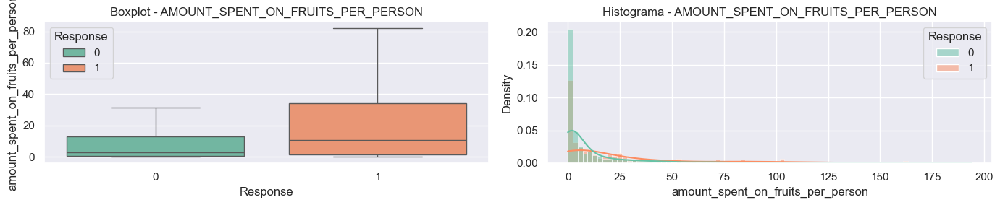

In [129]:
numeric_feature(df_analysis_data, 'amount_spent_on_fruits_per_person') 

### amount_spent_on_fish_per_person

In [130]:
# Just like meat, everyone can eat fish. 
# It seems fair to assume that all the purchased fish is divided among all the people living in the customer's house.

In [131]:
df_analysis_data['amount_spent_on_fish_per_person'] = df_analysis_data['MntFishProducts']/df_analysis_data['number_of_residents']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,18.28,33.08,0.0,0.85,4.0,19.0,227.0
1,333.0,36.83,50.25,0.0,1.50,13.0,53.0,250.0


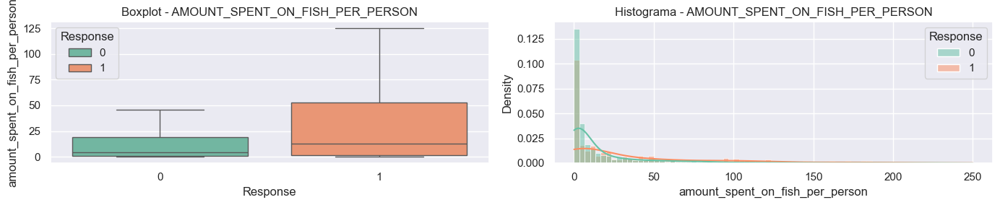

In [132]:
numeric_feature(df_analysis_data, 'amount_spent_on_fish_per_person') 

### amount_spent_on_sweet_per_person

In [133]:
# Everyone can eat sweet food. 
# Wr assume that all the purchased sweet food is divided among all the people living in the customer's house.

In [134]:
df_analysis_data['amount_spent_on_sweet_per_person'] = df_analysis_data['MntSweetProducts']/df_analysis_data['number_of_residents']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,12.73,24.06,0.0,0.33,2.67,13.0,262.0
1,333.0,28.11,40.32,0.0,1.25,10.50,38.0,198.0


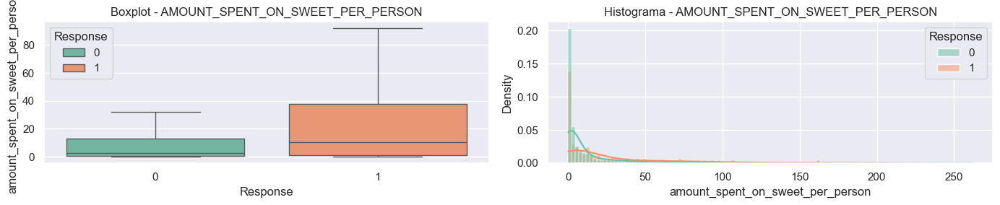

In [135]:
numeric_feature(df_analysis_data, 'amount_spent_on_sweet_per_person') 

### percentage_web_purchase_success

In [136]:
# NumWebPurchases: Number of purchases made through the company’s website
# NumWebVisitsMonth: Number of visits to company’s website in the last month

In [137]:
# We don't know for sure if both features were collected for the same period of time. 
# We are aware that it can be dangerous to combine information from different times. 

# Our goal is to gain an understanding of the web sales conversion. 
# We won't use it to model the behavior

In [138]:
for index, row in df_analysis_data.iterrows():
    if row['NumWebVisitsMonth'] == 0:
        df_analysis_data.at[index, 'percentage_web_purchase_success'] = 0
    else:
        df_analysis_data.at[index, 'percentage_web_purchase_success'] = row['NumWebPurchases'] / row['NumWebVisitsMonth']

,count,mean,std,min,25%,50%,75%,max
Response,,,,,,,,
0,1882.0,1.02,1.23,0.0,0.29,0.67,1.5,27.0
1,333.0,1.38,1.04,0.0,0.50,1.17,2.0,5.0


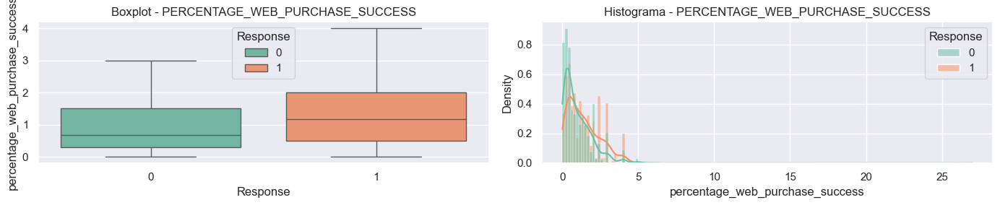

In [139]:
numeric_feature(df_analysis_data, 'percentage_web_purchase_success')

In [140]:
# Verify the 'total_amount_spent_2y' distribution
df_analysis_data.groupby('Response')['total_amount_spent_2y'].quantile(quantiles).unstack().round(2)

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
Response,,,,,,,,,,,,,,,,,,,,,
0,5.0,21.0,32.0,42.0,50.0,62.0,76.3,102.0,153.8,232.45,314.0,414.0,538.6,680.0,819.0,957.0,1064.8,1187.55,1377.9,1615.95,2525.0
1,17.0,50.2,69.2,95.8,163.4,252.0,393.6,488.8,653.0,856.00,1053.0,1176.0,1244.4,1393.0,1511.4,1617.0,1714.0,1820.40,1939.0,2088.60,2525.0


In [141]:
# See who is outlier:
df_analysis_data[['ID','Response','total_amount_spent_2y','NumWebPurchases','NumWebVisitsMonth','percentage_web_purchase_success']].sort_values(by='percentage_web_purchase_success', ascending=False).head(3)

# It doesn't appear to be necessary to drop these lines from the dataset. 
# Decision: keep outliers.

,ID,Response,total_amount_spent_2y,NumWebPurchases,NumWebVisitsMonth,percentage_web_purchase_success
1898,4619,0,277,27,1,27.0
1975,10311,0,359,25,1,25.0
878,1446,0,1226,6,1,6.0


## Drop Irrelevant Features

In [142]:
df_analysis_data.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,drop_lines,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,year_Customer,month_Customer,month_year_Customer,days_since_enrollment,Customers_age,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products,adults_count,amount_spent_on_wine_per_adult,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_fruits_per_person,amount_spent_on_fish_per_person,amount_spent_on_sweet_per_person,percentage_web_purchase_success
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,1617,22,0,13.636364,5.442177,2012,9,2012-09,4413,67,663,39,Medium,2,0,1,58138.0,2.781313,1,635.0,88.0,546.0,88.000000,172.000000,88.000000,1.142857
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,27,4,2,50.000000,22.222222,2014,3,2014-03,3863,70,113,42,Medium,2,0,3,15448.0,0.058260,1,11.0,6.0,2.0,0.333333,0.666667,0.333333,0.200000
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,0,776,20,0,5.000000,5.412371,2013,8,2013-08,4062,59,312,31,Medium,2,1,2,35806.5,1.083602,2,213.0,21.0,63.5,24.500000,55.500000,10.500000,2.000000


In [143]:
columns_to_drop = [
# We have to drop the features that won't be available in new data: 
'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',

# We also want to drop columns that won't be used to model the problem:
'Dt_Customer','Year_Birth', 'year_Customer','month_Customer','month_year_Customer', 'days_since_enrollment','Customers_age', 'Education','Kidhome','Teenhome', 'drop_lines']

In [144]:
df_analysis_data = df_analysis_data.drop(columns_to_drop, axis=1)

In [145]:
# Verify the dataframe after dropping the columns
df_analysis_data.head(3)

,ID,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products,adults_count,amount_spent_on_wine_per_adult,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_fruits_per_person,amount_spent_on_fish_per_person,amount_spent_on_sweet_per_person,percentage_web_purchase_success
0,5524,Single,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,1,1617,22,0,13.636364,5.442177,663,39,Medium,2,0,1,58138.0,2.781313,1,635.0,88.0,546.0,88.000000,172.000000,88.000000,1.142857
1,2174,Single,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,27,4,2,50.000000,22.222222,113,42,Medium,2,0,3,15448.0,0.058260,1,11.0,6.0,2.0,0.333333,0.666667,0.333333,0.200000
2,4141,Together,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,776,20,0,5.000000,5.412371,312,31,Medium,2,1,2,35806.5,1.083602,2,213.0,21.0,63.5,24.500000,55.500000,10.500000,2.000000


# Feature Selection Techniques

## Weigh of evidence (WOE) & Information Value (IV)

### Import function

In [146]:
import pandas.core.algorithms as algos
from pandas import Series
import re
import traceback
import string

import math
import seaborn as sns
import scipy as sp
from scipy import stats
from scipy.stats import linregress
from scipy.stats import chi2

import datetime
from datetime import date
from functools import reduce

max_bin = 20
force_bin = 3

def mono_bin(Y, X, n=max_bin):
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X', 'Y']][df1.X.isnull()]
    notmiss = df1[['X', 'Y']][df1.X.notnull()]
    r = 0
    while np.abs(r) < 1:
        try:
            d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.qcut(notmiss.X, n)})
            d2 = d1.groupby('Bucket', as_index=True)
            r, p = stats.spearmanr(d2.mean().X, d2.mean().Y)
            n = n - 1
        except Exception as e:
            n = n - 1

    if len(d2) == 1:
        n = force_bin
        bins = np.quantile(notmiss.X, np.linspace(0, 1, n))
        if len(np.unique(bins)) == 2:
            bins = np.insert(bins, 0, 1)
            bins[1] = bins[1] - (bins[1] / 2)
        d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.cut(notmiss.X, np.unique(bins), include_lowest=True)})
        d2 = d1.groupby('Bucket', as_index=True)


    d3_list = []

    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE': [np.nan], 'MAX_VALUE': [np.nan], 'COUNT': [justmiss.count().Y],
                            'EVENT': [justmiss.sum().Y], 'NONEVENT': [justmiss.count().Y - justmiss.sum().Y]})
        d3_list.append(d4)

    if len(d2) > 0: 
        d3 = pd.DataFrame(columns=['MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'NONEVENT'])
        d3["MIN_VALUE"] = d2.min().X
        d3["MAX_VALUE"] = d2.max().X
        d3["COUNT"] = d2.count().Y
        d3["EVENT"] = d2.sum().Y
        d3["NONEVENT"] = d2.count().Y - d2.sum().Y
        d3 = d3.reset_index(drop=True)
        d3_list.append(d3)


    if d3_list:
        d3 = pd.concat(d3_list, ignore_index=True)
        d3["EVENT_RATE"] = d3.EVENT / d3.COUNT
        d3["NON_EVENT_RATE"] = d3.NONEVENT / d3.COUNT
        d3["DIST_EVENT"] = d3.EVENT / d3.sum().EVENT
        d3["DIST_NON_EVENT"] = d3.NONEVENT / d3.sum().NONEVENT
        d3["WOE"] = np.log(d3.DIST_EVENT / d3.DIST_NON_EVENT)
        d3["IV"] = (d3.DIST_EVENT - d3.DIST_NON_EVENT) * np.log(d3.DIST_EVENT / d3.DIST_NON_EVENT)
        d3["VAR_NAME"] = "VAR"
        d3 = d3[['VAR_NAME', 'MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE',
                 'DIST_EVENT', 'DIST_NON_EVENT', 'WOE', 'IV']]
        d3 = d3.replace([np.inf, -np.inf], 0)
        d3.IV = d3.IV.sum()
    else:
        d3 = pd.DataFrame()  

    return d3



def char_bin(Y, X):
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X', 'Y']][df1.X.isnull()]
    notmiss = df1[['X', 'Y']][df1.X.notnull()]
    df2 = notmiss.groupby('X', as_index=True)

    d3 = pd.DataFrame(columns=['COUNT', 'MIN_VALUE', 'MAX_VALUE', 'EVENT', 'NONEVENT'])

    d3["COUNT"] = df2.count().Y
    d3["MIN_VALUE"] = df2.sum().Y.index
    d3["MAX_VALUE"] = d3["MIN_VALUE"]
    d3["EVENT"] = df2.sum().Y
    d3["NONEVENT"] = df2.count().Y - df2.sum().Y

    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE': [np.nan], 'MAX_VALUE': [np.nan], 'COUNT': [justmiss.count().Y],
                            'EVENT': [justmiss.sum().Y], 'NONEVENT': [justmiss.count().Y - justmiss.sum().Y]})
        d3 = d3.append(d4, ignore_index=True)

    d3["EVENT_RATE"] = d3.EVENT / d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT / d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT / d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT / d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT / d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT - d3.DIST_NON_EVENT) * np.log(d3.DIST_EVENT / d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME', 'MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE',
             'DIST_EVENT', 'DIST_NON_EVENT', 'WOE', 'IV']]
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    d3 = d3.reset_index(drop=True)

    return d3

def data_vars(df1, target):
    stack = traceback.extract_stack()
    filename, lineno, function_name, code = stack[-2]
    vars_name = re.compile(r'\((.*?)\).*$').search(code).groups()[0]
    final = (re.findall(r"[\w']+", vars_name))[-1]

    x = df1.dtypes.index
    iv_df = [] 
    count = -1

    for i in x:
        if i.upper() not in (final.upper()):
            if np.issubdtype(df1[i], np.number) and len(df1[i].unique()) > 2:
                conv = mono_bin(target, df1[i])
                conv["VAR_NAME"] = i
                count = count + 1
            else:
                conv = char_bin(target, df1[i])
                conv["VAR_NAME"] = i            
                count = count + 1
                
            if count == 0:
                if isinstance(conv, pd.DataFrame):  
                    iv_df = [conv]
            else:
                if 'iv_df' in locals() and isinstance(conv, pd.DataFrame):  
                    iv_df.append(conv)

    iv_df = pd.concat(iv_df, ignore_index=True) if iv_df else pd.DataFrame() 
    iv = pd.DataFrame({'IV': iv_df.groupby('VAR_NAME').IV.max()})
    iv = iv.reset_index()
    return iv_df, iv

### Run IV

| Range |     Prediction   |
|:---------:|:----------------:|
| IV < 0.02 | not useful for prediction |
| 0.02 ≤ IV < 0.1 |  weak predictor | 
| 0.1 ≤ IV < 0.3 | moderate predictor | 
| 0.3 ≤ IV < 0.5 | strong predictor | 
| IV ≥ 0.5 | suspicious predictor | 

In [147]:
# Information value (IV) is a powerful tool in machine learning that is used to assess the predictive power of a given feature in a dataset.
# The IV is calculated by comparing the distribution of the feature values for the target variable against the distribution of the feature values for the non-target variable 
# IV is commonly used in feature selection

In [148]:
# df_analysis_data.columns.to_list()

In [149]:
woe_feature_selection = [#'ID',
 'Marital_Status', 'Income', 'Recency',
 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
 'Complain', 'Response',
 'total_amount_spent_2y', 'total_sales_channel_purchases', 'number_of_kids', 'discount_rate', 'gold_products_amount_rate', 'enrollment_order', 'age_order',
 'education_level', 'education_order_level', 'customer_has_a_partner', 'number_of_residents', 'income_per_people_in_the_house', 'percentage_income_spent_on_products', 'adults_count',
 'amount_spent_on_wine_per_adult', 'amount_spent_on_gold_per_adult', 'amount_spent_on_meat_per_person', 'amount_spent_on_fruits_per_person', 'amount_spent_on_fish_per_person', 'amount_spent_on_sweet_per_person', 'percentage_web_purchase_success']

In [150]:
# Run function
final_results, IV = data_vars(df_analysis_data[woe_feature_selection], df_analysis_data[woe_feature_selection].Response)

# Order features by their predictive power:
IV_features_result = final_results[['VAR_NAME','IV']].sort_values(by='IV', ascending=False).drop_duplicates(ignore_index=True)

### IV: best features

In [151]:
# Select features that are moderate to strong predictors:
IV_best_features = IV_features_result[IV_features_result['IV'] >= 0.25].copy()
IV_best_features

,VAR_NAME,IV
0,percentage_income_spent_on_products,0.567852
1,total_amount_spent_2y,0.547669
2,MntMeatProducts,0.453681
3,amount_spent_on_gold_per_adult,0.452233
4,amount_spent_on_meat_per_person,0.441112
5,amount_spent_on_wine_per_adult,0.397307
6,income_per_people_in_the_house,0.375643
7,MntGoldProds,0.349295
8,Recency,0.345327
9,enrollment_order,0.326437


## Correlation

In [152]:
# Highly correlated features refer to variables that have a strong linear relationship with each other
# The goal is to reduce the number of features in the dataset and improve the performance and interpretability of the model

In [153]:
# IV_best_features.VAR_NAME.to_list()

In [154]:
df_corr = df_analysis_data[['percentage_income_spent_on_products', 'total_amount_spent_2y', 'MntMeatProducts',
 'amount_spent_on_gold_per_adult', 'amount_spent_on_meat_per_person', 'amount_spent_on_wine_per_adult', 'income_per_people_in_the_house',
 'MntGoldProds', 'Recency', 'enrollment_order', 'NumCatalogPurchases', 'NumWebPurchases', 'MntWines']]

In [155]:
# Calculate the correlation matrix
correlation_matrix = df_corr.corr()

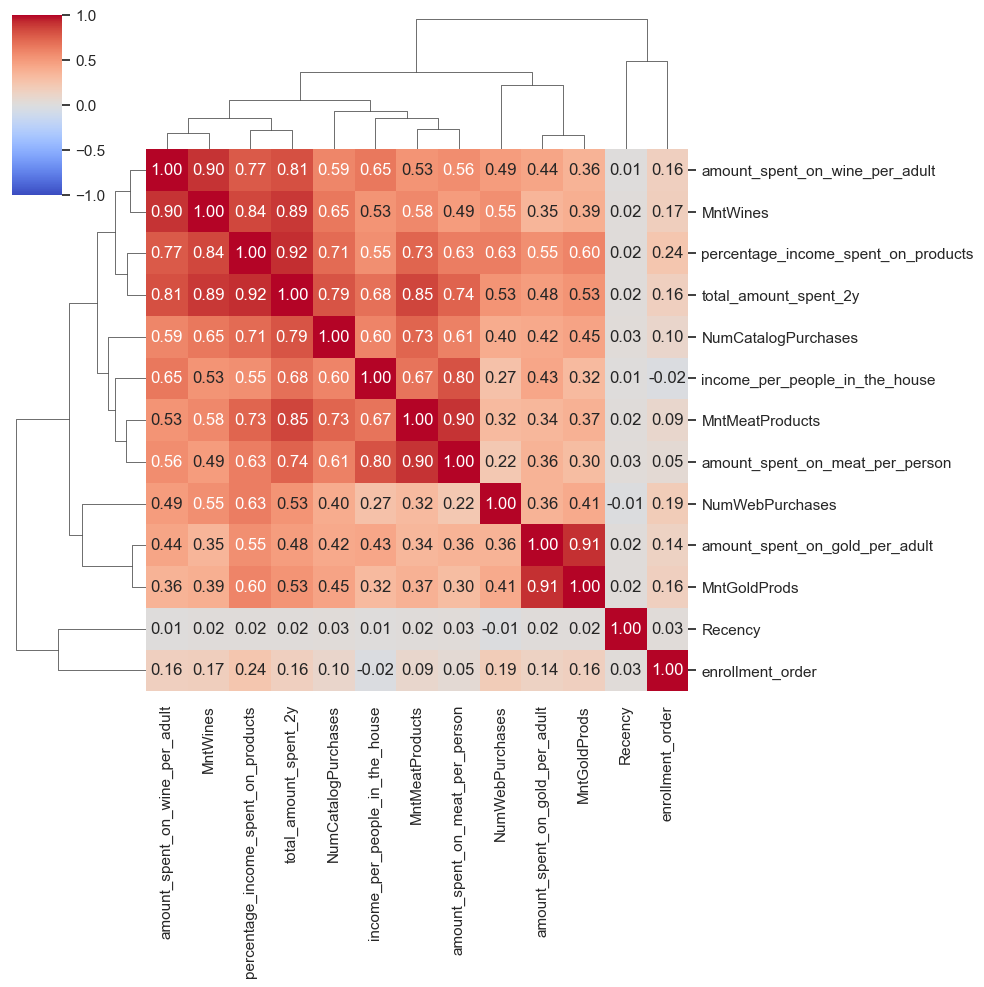

In [156]:
sns.clustermap(correlation_matrix.round(2), figsize=(10, 10), annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.show()

# Clustering

In [157]:
# Clustering is a data science technique that groups similar rows in a data set, without the need for specific labels
# In terms of data performance, we cannot observe the characteristics of more than three dimensions with human eyes
# It's interesting to reduce the dimensions before clustering the public

### 0. What is the optimal number of clusters?

In [158]:
list_IV_best_features = IV_best_features.VAR_NAME.to_list()
print(list_IV_best_features)

['percentage_income_spent_on_products', 'total_amount_spent_2y', 'MntMeatProducts', 'amount_spent_on_gold_per_adult', 'amount_spent_on_meat_per_person', 'amount_spent_on_wine_per_adult', 'income_per_people_in_the_house', 'MntGoldProds', 'Recency', 'enrollment_order', 'NumCatalogPurchases', 'NumWebPurchases', 'MntWines']


In [159]:
df_clusters = df_analysis_data[list_IV_best_features].copy()

In [160]:
df_clusters.head(2)

,percentage_income_spent_on_products,total_amount_spent_2y,MntMeatProducts,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,MntGoldProds,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,MntWines
0,2.781313,1617,546,88.0,546.0,635.0,58138.0,88,58,663,10,8,635
1,0.058260,27,6,6.0,2.0,11.0,15448.0,6,38,113,1,1,11


  File "C:\Users\carat\anaconda3\envs\ambiente_julia\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


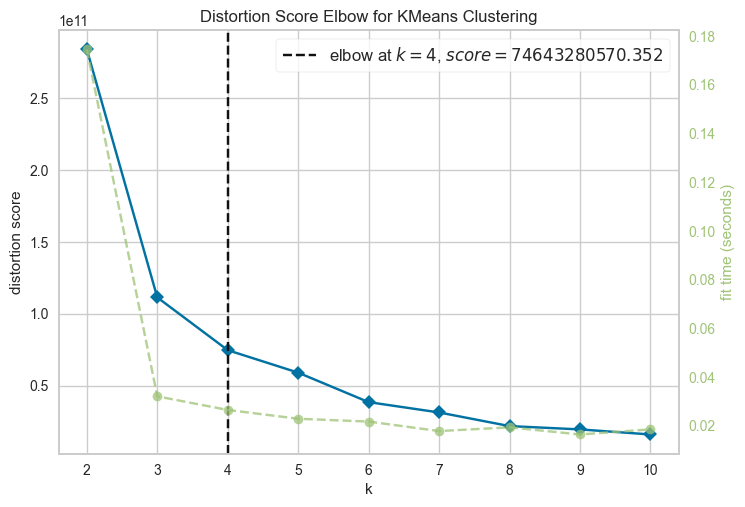

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [161]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

# Who many clusters?
# KElbowVisualizer visualizes the clusters according to a scoring function, looking for an "elbow" in the curve.

model = KMeans()

Elbow_M = KElbowVisualizer(model)
Elbow_M.fit(df_clusters)
Elbow_M.poof()

### 1. StandardScaler

In [162]:
# Dimensionality reduction: When the features are highly redundant (multicollinear), PCA will partition out the redundancy into one or more near-zero variance components
# Decorrelation: PCA transforms correlated features into uncorrelated components, which could be easier for your algorithm to work with.

In [163]:
# Standardization

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_clusters)

In [164]:
# print(scaled_features)

In [165]:
# Transform the results in a DF with the original columns

df_scaled_features = pd.DataFrame(scaler.transform(df_clusters), columns=df_clusters.columns)

In [166]:
df_scaled_features.head(2)

,percentage_income_spent_on_products,total_amount_spent_2y,MntMeatProducts,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,MntGoldProds,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,MntWines
0,2.289466,1.677265,1.711738,1.479392,2.745075,1.686001,1.662392,0.849596,0.310357,1.529487,2.551584,1.428275,0.977777
1,-1.132963,-0.962054,-0.722606,-0.616077,-0.574472,-0.773994,-0.479443,-0.733190,-0.380538,-1.187954,-0.576888,-1.126865,-0.872394


### 2. Create Clusters

In [167]:
# Try to cluster data in 4 different groups

from sklearn.cluster import AgglomerativeClustering

cluster_model = AgglomerativeClustering(n_clusters=4)

In [168]:
cluster_model

AgglomerativeClustering(n_clusters=4)

In [169]:
# Fit and return the result of each sample's clustering assignment.

fit_predict_cluster_model = cluster_model.fit_predict(df_scaled_features)
fit_predict_cluster_model

array([0, 1, 2, ..., 0, 2, 1])

In [170]:
# Adding the 'Cluster' Label to all DFs
df_scaled_features["Clusters"] = fit_predict_cluster_model

# Add to the main dataframes: 
df_clusters["Clusters"] = fit_predict_cluster_model # Features that were used to create customer's segmentation
df_analysis_data["Clusters"]= fit_predict_cluster_model # All features

In [171]:
df_scaled_features.head(2)

,percentage_income_spent_on_products,total_amount_spent_2y,MntMeatProducts,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,MntGoldProds,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,MntWines,Clusters
0,2.289466,1.677265,1.711738,1.479392,2.745075,1.686001,1.662392,0.849596,0.310357,1.529487,2.551584,1.428275,0.977777,0
1,-1.132963,-0.962054,-0.722606,-0.616077,-0.574472,-0.773994,-0.479443,-0.733190,-0.380538,-1.187954,-0.576888,-1.126865,-0.872394,1


In [172]:
df_clusters.head(2)

,percentage_income_spent_on_products,total_amount_spent_2y,MntMeatProducts,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,MntGoldProds,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,MntWines,Clusters
0,2.781313,1617,546,88.0,546.0,635.0,58138.0,88,58,663,10,8,635,0
1,0.058260,27,6,6.0,2.0,11.0,15448.0,6,38,113,1,1,11,1


### 4. PCA

In [173]:
# Create the principal components.

from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca.fit(df_scaled_features)
pca_results = pca.transform(df_scaled_features)

In [174]:
pca_results

array([[ 5.86940805, -0.81438662,  0.33814954],
       [-2.66265223, -0.58224052, -0.91480379],
       [ 0.49325974,  0.53790099,  0.43573646],
       ...,
       [ 2.80013924, -2.17903398,  0.39030684],
       [ 0.79373781,  0.52513538, -0.40560265],
       [-1.83305108,  0.13298596,  0.75837109]])

In [175]:
# Transform the PCA result in a DF

df_pca_results = pd.DataFrame(pca.transform(df_scaled_features), columns=(["x_axis","y_axis", "z_axis"]))

In [176]:
df_pca_results.head(2)

,x_axis,y_axis,z_axis
0,5.869408,-0.814387,0.338150
1,-2.662652,-0.582241,-0.914804


In [177]:
# Plot the Customer Segmentation in different colors 

fig = px.scatter_3d(df_pca_results,
                    x='x_axis',
                    y='y_axis', 
                    z='z_axis', 
                    color_continuous_scale='Viridis',
                    size_max=5, 
                    opacity=0.5, 
                    title="Customer Segmentation")

fig.show()

In [178]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=df_pca_results['x_axis'], 
                                   y=df_pca_results['y_axis'], 
                                   z=df_pca_results['z_axis'],
                mode='markers', 
                marker=dict(size=10, 
                            color=df_pca_results['z_axis'], 
                            colorscale='Viridis', 
                            opacity=0.8))])

fig.update_layout(title_text='PCA results', title_font_size=24)
fig.show()

### 3. Clustering Evaluation

#### 3.1. Target distribution

In [179]:
# How is the distribution of all clients in each cluster?

df_analysis_data.groupby(['Clusters']).ID.nunique()*100 / df_analysis_data.ID.nunique() 

Clusters
0    17.426637
1    51.828442
2    24.063205
3     6.681716
Name: ID, dtype: float64

In [180]:
# Considering only clients who accepted the offer in the last campaign, how are they distributed?

clusters_index = df_analysis_data[df_analysis_data['Response'] == 1].groupby(['Clusters']).ID.nunique()*100 / df_analysis_data[df_analysis_data['Response'] == 1].ID.nunique()
clusters_index = clusters_index.reset_index()

# Percentage distribution of clients in the target group:
clusters_index.sort_values(by='ID', ascending=False).round(2)

,Clusters,ID
0,0,39.04
1,1,28.83
2,2,20.72
3,3,11.41


In [181]:
# Considering all clients in each group (cluster), how is the distribution of clients who accepted the offer in the last campaign?

response_index = df_analysis_data.groupby(['Clusters','Response']).ID.nunique()*100 / df_analysis_data.groupby('Clusters').ID.nunique()
response_index = response_index.reset_index()

# Considering each cluster separately, each of them has a percentage below of target IDs, in relation to the total IDs of each group:
response_index[response_index['Response'] == 1][['Clusters','ID']].sort_values(by='ID', ascending=False).round(2)

,Clusters,ID
1,0,33.68
7,3,25.68
5,2,12.95
3,1,8.36


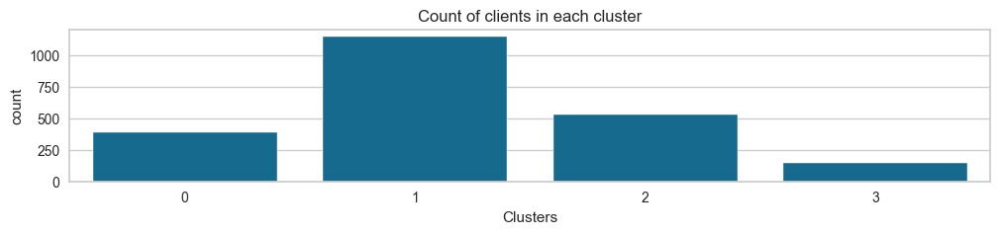

In [182]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 2))
ax = sns.countplot(x=df_clusters["Clusters"])
ax.set_title("Count of clients in each cluster")
plt.show()

#### 3.2. Profile distribution

In [183]:
# We want to explore the main characteristics of each cluster. 
# All available features are in the original dataframe:

df_analysis_data.head(2)

,ID,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products,adults_count,amount_spent_on_wine_per_adult,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_fruits_per_person,amount_spent_on_fish_per_person,amount_spent_on_sweet_per_person,percentage_web_purchase_success,Clusters
0,5524,Single,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,1,1617,22,0,13.636364,5.442177,663,39,Medium,2,0,1,58138.0,2.781313,1,635.0,88.0,546.0,88.000000,172.000000,88.000000,1.142857,0
1,2174,Single,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,27,4,2,50.000000,22.222222,113,42,Medium,2,0,3,15448.0,0.058260,1,11.0,6.0,2.0,0.333333,0.666667,0.333333,0.200000,1


In [184]:
df_analysis_data['Clusters'] = df_analysis_data['Clusters'].astype('str')

In [185]:
# Create function to plot the distribution of each cluster

def plot_clusters_boxplot(feature):

    # Tamanho da figura:
    plt.figure(figsize=(14, 3)) 
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Clusters', y=feature, hue='Clusters', data=df_analysis_data, palette='Set2', showfliers=False)
    plt.title(f'Boxplot - {column.upper()}')

    plt.subplot(1, 2, 2)
    sns.histplot(data=df_analysis_data, x=feature, hue='Clusters', kde=True, stat='density', palette='Set2', common_norm=False, legend=True)
    plt.title(f'Histograma - {feature.upper()}')
    plt.tight_layout()
    plt.show()  

    
    display(df_analysis_data.groupby('Clusters')[feature].describe().sort_values(by='50%', ascending=False).round(2))

##### How much did they spend?

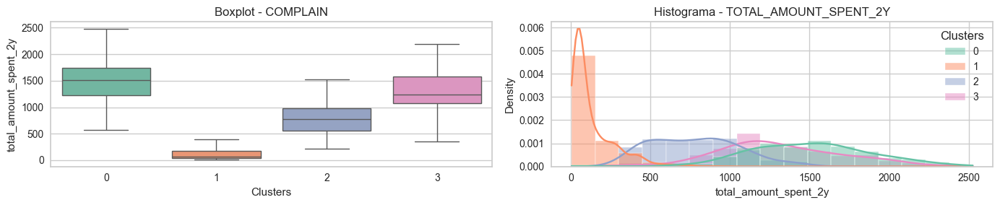

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,1502.83,384.87,6.0,1230.25,1505.5,1737.25,2524.0
3,148.0,1323.84,393.34,359.0,1077.75,1244.0,1574.00,2525.0
2,533.0,780.41,278.67,213.0,556.00,775.0,976.00,1761.0
1,1148.0,132.03,138.34,5.0,42.00,71.5,180.50,902.0


In [186]:
plot_clusters_boxplot('total_amount_spent_2y')

In [187]:
# Details
quantiles = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
df_analysis_data.groupby('Clusters')['total_amount_spent_2y'].quantile(quantiles).unstack().round(2)

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
Clusters,,,,,,,,,,,,,,,,,,,,,
0,6.0,957.75,1054.5,1123.00,1178.0,1230.25,1287.0,1335.50,1388.0,1459.50,1505.5,1552.25,1596.0,1639.25,1689.0,1737.25,1820.0,1912.0,2011.0,2124.25,2524.0
1,5.0,17.00,22.0,29.05,36.0,42.00,46.0,51.45,57.0,64.15,71.5,81.00,96.0,120.00,144.9,180.50,226.2,270.0,322.0,419.55,902.0
2,213.0,375.00,425.2,467.00,504.8,556.00,592.4,637.00,684.0,730.00,775.0,815.60,860.0,900.00,930.8,976.00,1019.6,1072.2,1146.8,1257.00,1761.0
3,359.0,793.70,878.1,973.25,1029.4,1077.75,1115.5,1155.45,1177.8,1194.60,1244.0,1334.40,1367.8,1425.75,1493.4,1574.00,1645.2,1749.3,1893.6,1979.10,2525.0


In [188]:
# Comparing to the hole public
quantiles = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]
df_analysis_data.groupby('Response')['total_amount_spent_2y'].quantile(quantiles).unstack().round(2)

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
Response,,,,,,,,,,,,,,,,,,,,,
0,5.0,21.0,32.0,42.0,50.0,62.0,76.3,102.0,153.8,232.45,314.0,414.0,538.6,680.0,819.0,957.0,1064.8,1187.55,1377.9,1615.95,2525.0
1,17.0,50.2,69.2,95.8,163.4,252.0,393.6,488.8,653.0,856.00,1053.0,1176.0,1244.4,1393.0,1511.4,1617.0,1714.0,1820.40,1939.0,2088.60,2525.0


##### Which groups drink the most wine?

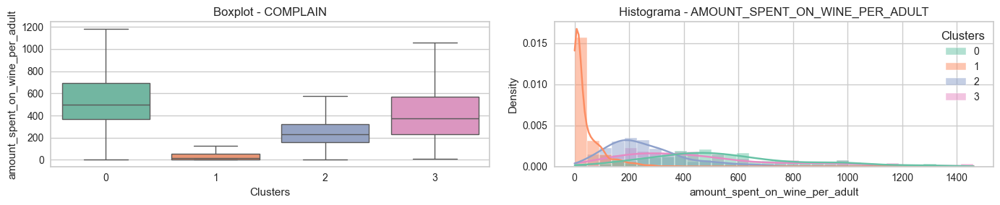

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,545.26,275.69,0.5,364.75,500.5,695.12,1332.0
3,148.0,451.15,297.49,8.0,229.12,377.0,568.25,1462.0
2,533.0,255.10,141.77,3.5,156.50,229.0,323.50,801.0
1,1148.0,40.10,54.10,0.0,5.50,16.0,55.12,367.0


In [189]:
plot_clusters_boxplot('amount_spent_on_wine_per_adult')

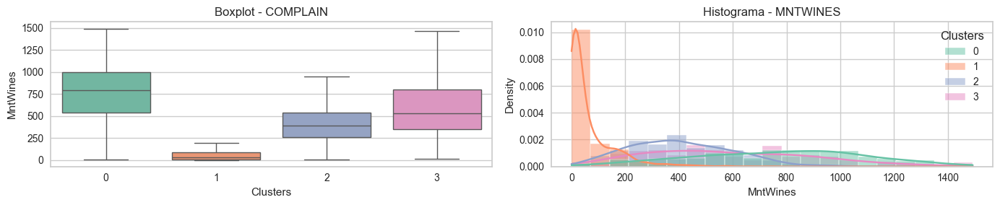

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,770.84,322.30,1.0,541.0,790.5,1000.0,1493.0
3,148.0,594.78,315.02,16.0,348.5,532.0,799.5,1486.0
2,533.0,405.69,193.23,7.0,260.0,389.0,534.0,1142.0
1,1148.0,64.70,91.59,0.0,9.0,26.0,84.0,734.0


In [190]:
plot_clusters_boxplot('MntWines')

##### Which groups like the most gold products?

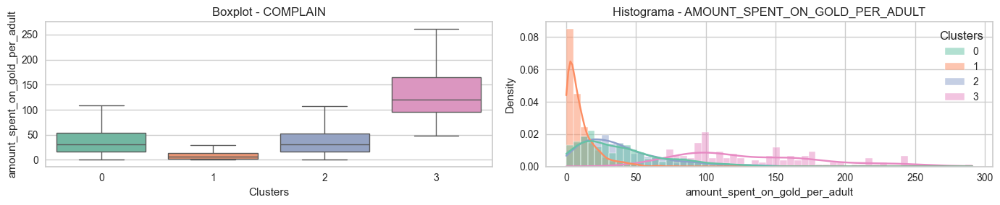

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,132.14,51.07,47.5,95.5,120.25,165.25,291.0
0,386.0,38.87,29.99,0.0,16.0,31.50,54.00,134.0
2,533.0,38.61,29.39,0.0,16.5,31.50,53.00,176.0
1,1148.0,10.06,10.74,0.0,2.5,6.50,13.50,76.0


In [191]:
plot_clusters_boxplot('amount_spent_on_gold_per_adult')

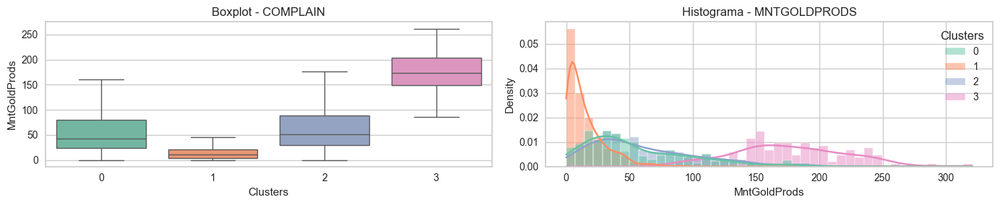

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,176.24,43.98,86.0,148.75,173.5,204.25,321.0
2,533.0,61.40,43.37,0.0,29.00,51.0,88.00,229.0
0,386.0,54.45,41.48,0.0,24.25,42.0,80.00,210.0
1,1148.0,15.33,15.13,0.0,4.00,11.0,21.00,96.0


In [192]:
plot_clusters_boxplot('MntGoldProds')

##### Which groups are "healthier"?

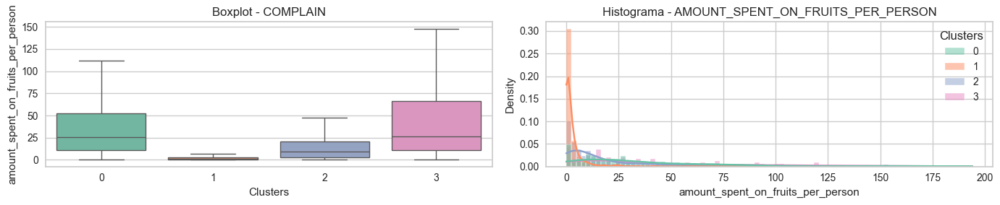

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,41.36,42.62,0.0,10.88,26.17,66.00,172.00
0,386.0,37.62,39.24,0.0,11.00,25.75,52.12,194.00
2,533.0,16.60,21.20,0.0,2.50,9.00,20.67,174.00
1,1148.0,2.71,5.35,0.0,0.25,1.00,3.00,59.33


In [193]:
plot_clusters_boxplot('amount_spent_on_fruits_per_person')

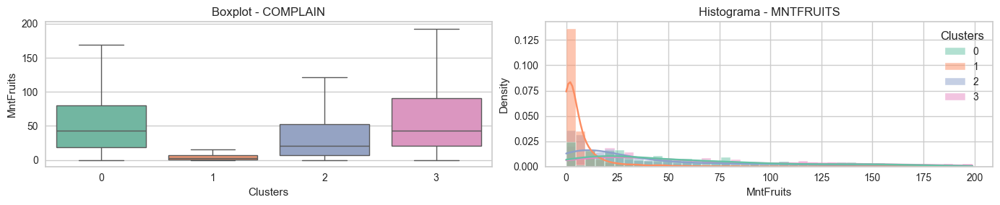

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,61.54,53.68,0.0,20.75,43.5,91.25,199.0
0,386.0,56.44,49.19,0.0,19.00,43.0,80.00,194.0
2,533.0,37.42,41.92,0.0,7.00,21.0,53.00,197.0
1,1148.0,6.59,12.19,0.0,1.00,3.0,7.00,178.0


In [194]:
plot_clusters_boxplot('MntFruits')

##### Which groups like fish?

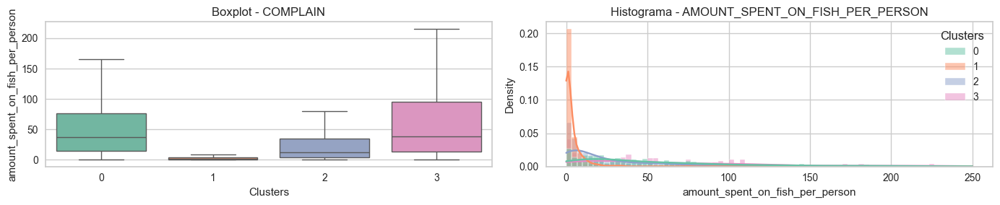

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,60.08,58.36,0.0,13.25,38.83,95.25,227.0
0,386.0,53.00,51.15,0.0,15.38,37.25,76.25,250.0
2,533.0,24.44,29.27,0.0,3.67,13.00,34.50,175.0
1,1148.0,3.74,7.28,0.0,0.48,1.33,4.00,89.5


In [195]:
plot_clusters_boxplot('amount_spent_on_fish_per_person')

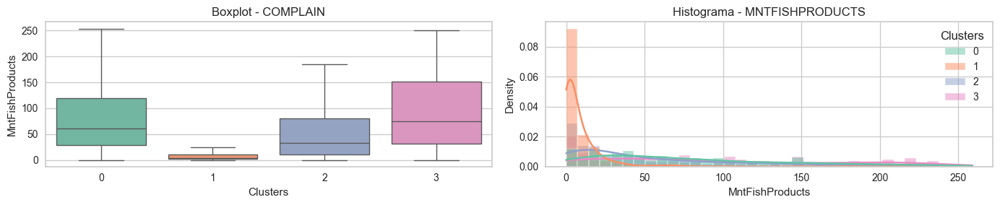

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
3,148.0,92.18,74.92,0.0,31.00,75.0,151.0,250.0
0,386.0,78.63,64.24,0.0,28.25,61.5,120.0,258.0
2,533.0,54.01,57.09,0.0,11.00,33.0,81.0,259.0
1,1148.0,9.25,17.07,0.0,2.00,4.0,11.0,179.0


In [196]:
plot_clusters_boxplot('MntFishProducts')

##### Which groups like meat?

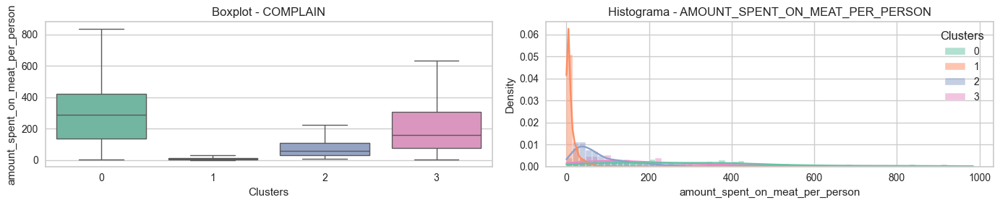

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,319.65,226.12,1.0,137.69,287.25,422.25,984.0
3,148.0,234.22,217.41,4.0,77.58,158.00,305.00,951.0
2,533.0,78.84,62.64,6.5,32.50,59.00,109.00,345.0
1,1148.0,11.22,13.93,0.0,3.00,5.67,14.00,108.0


In [197]:
plot_clusters_boxplot('amount_spent_on_meat_per_person')

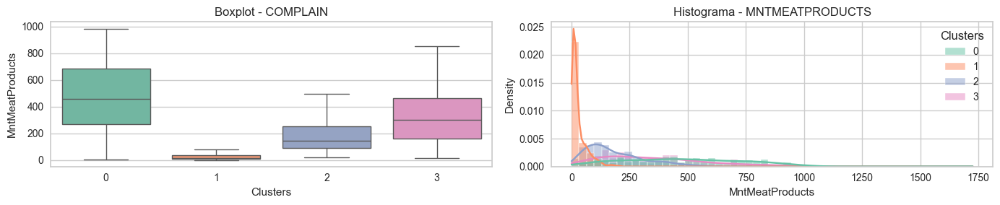

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,481.96,269.18,1.0,266.00,455.0,682.25,1725.0
3,148.0,343.89,217.96,12.0,161.75,303.0,462.50,951.0
2,533.0,182.79,123.35,21.0,91.00,144.0,253.00,690.0
1,1148.0,29.60,33.55,0.0,8.00,16.0,37.25,206.0


In [198]:
plot_clusters_boxplot('MntMeatProducts')

##### What is their family type?

In [199]:
df_analysis_data.groupby('Clusters')['number_of_residents'].describe().sort_values(by='50%', ascending=False).round(2)

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
1,1148.0,2.92,0.84,1.0,2.0,3.0,3.0,5.0
2,533.0,2.60,0.72,1.0,2.0,3.0,3.0,5.0
0,386.0,1.85,0.80,1.0,1.0,2.0,2.0,5.0
3,148.0,1.93,0.75,1.0,1.0,2.0,2.0,4.0


In [200]:
pd.crosstab(df_analysis_data['number_of_residents'], df_analysis_data['Clusters'], normalize='columns')

Clusters,0,1,2,3
number_of_residents,,,,
1,0.362694,0.039199,0.041276,0.304054
2,0.448187,0.253484,0.418386,0.472973
3,0.168394,0.475610,0.444653,0.209459
4,0.012953,0.208188,0.093809,0.013514
5,0.007772,0.023519,0.001876,0.000000


In [201]:
df_analysis_data.groupby('Clusters')['number_of_kids'].describe().sort_values(by='50%', ascending=False).round(2)

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
1,1148.0,1.25,0.70,0.0,1.0,1.0,2.0,3.0
2,533.0,0.89,0.63,0.0,0.0,1.0,1.0,3.0
0,386.0,0.32,0.57,0.0,0.0,0.0,1.0,3.0
3,148.0,0.46,0.58,0.0,0.0,0.0,1.0,2.0


In [202]:
pd.crosstab(df_analysis_data['number_of_kids'], df_analysis_data['Clusters'], normalize='columns')

Clusters,0,1,2,3
number_of_kids,,,,
0,0.725389,0.113240,0.257036,0.581081
1,0.243523,0.560976,0.604128,0.378378
2,0.020725,0.288328,0.133208,0.040541
3,0.010363,0.037456,0.005629,0.000000


In [203]:
pd.crosstab(df_analysis_data['customer_has_a_partner'], df_analysis_data['Clusters'], normalize='columns')

Clusters,0,1,2,3
customer_has_a_partner,,,,
0,0.46114,0.326655,0.290807,0.527027
1,0.53886,0.673345,0.709193,0.472973


##### What are the group's Incomes?

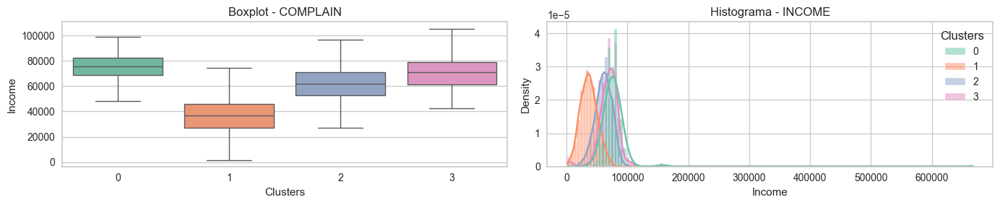

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,77822.06,32861.88,44802.0,68487.00,75809.5,82543.25,666666.0
3,148.0,69155.58,14970.30,4428.0,61212.25,71064.5,79015.25,105471.0
2,533.0,61311.05,13511.15,21888.0,52531.00,62058.0,71232.00,102160.0
1,1148.0,37303.42,15066.42,1730.0,27092.75,36630.5,46099.00,162397.0


In [204]:
plot_clusters_boxplot('Income')

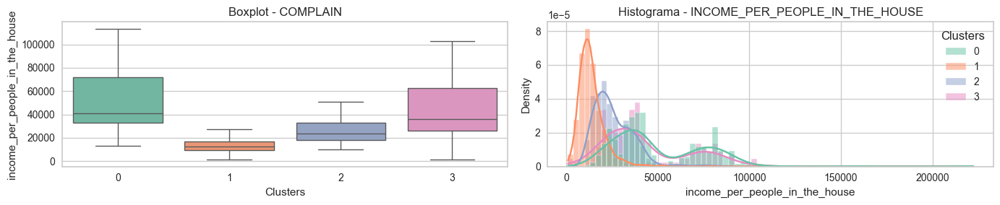

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,50284.91,25100.90,12900.80,32590.88,41022.25,72187.50,222222.0
3,148.0,43289.19,22853.30,1476.00,26138.92,36190.00,62378.75,102692.0
2,533.0,25873.21,10784.22,10179.33,18251.00,23592.33,32666.50,86037.0
1,1148.0,13742.78,7021.81,1005.75,9242.44,12417.46,16485.67,78462.0


In [205]:
plot_clusters_boxplot('income_per_people_in_the_house')

##### Use of Web and other sales channels

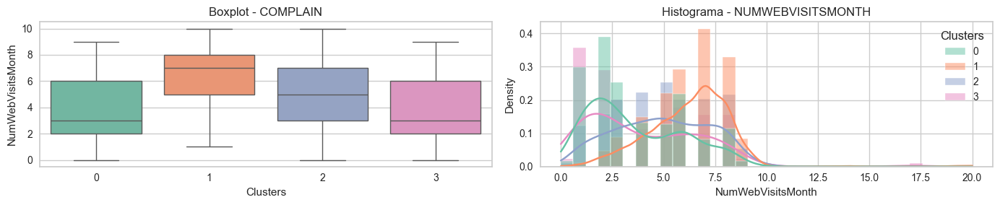

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
1,1148.0,6.26,2.01,0.0,5.0,7.0,8.0,20.0
2,533.0,4.92,2.29,0.0,3.0,5.0,7.0,10.0
0,386.0,3.61,2.28,0.0,2.0,3.0,6.0,9.0
3,148.0,3.95,2.72,0.0,2.0,3.0,6.0,17.0


In [206]:
plot_clusters_boxplot('NumWebVisitsMonth')

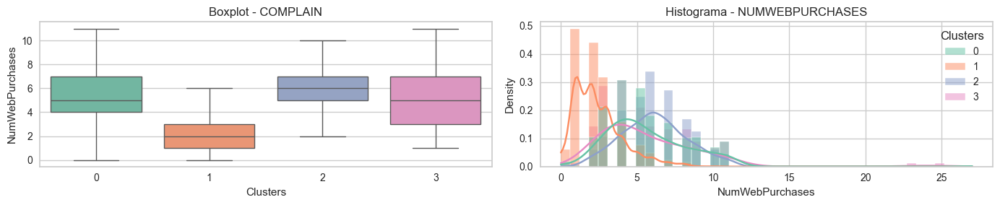

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
2,533.0,6.14,2.11,1.0,5.0,6.0,7.0,11.0
0,386.0,5.63,2.75,0.0,4.0,5.0,7.0,27.0
3,148.0,5.66,3.36,1.0,3.0,5.0,7.0,25.0
1,1148.0,2.41,1.60,0.0,1.0,2.0,3.0,10.0


In [207]:
plot_clusters_boxplot('NumWebPurchases')

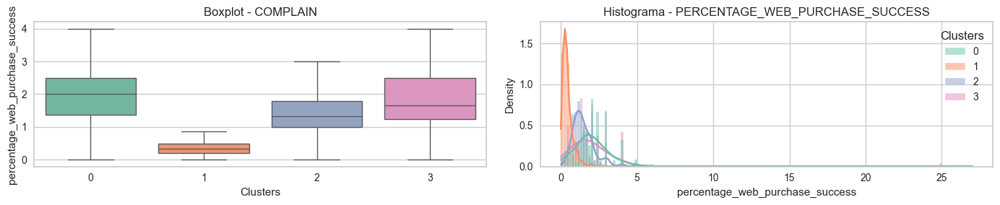

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,2.07,1.65,0.0,1.38,2.00,2.5,27.0
3,148.0,1.97,2.14,0.0,1.25,1.67,2.5,25.0
2,533.0,1.50,0.77,0.0,1.00,1.33,1.8,5.0
1,1148.0,0.43,0.35,0.0,0.20,0.33,0.5,3.0


In [208]:
plot_clusters_boxplot('percentage_web_purchase_success')

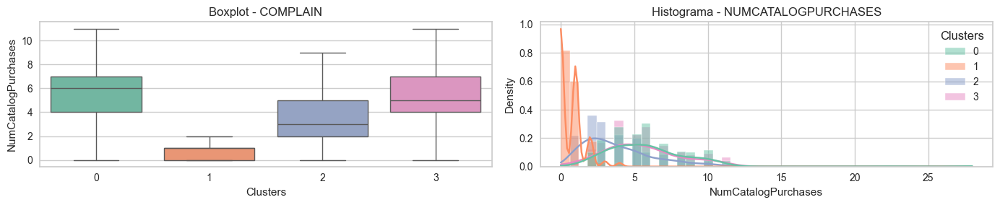

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,5.86,2.98,0.0,4.0,6.0,7.0,28.0
3,148.0,5.46,2.53,0.0,4.0,5.0,7.0,11.0
2,533.0,3.81,2.33,0.0,2.0,3.0,5.0,11.0
1,1148.0,0.69,0.84,0.0,0.0,1.0,1.0,4.0


In [209]:
plot_clusters_boxplot('NumCatalogPurchases')

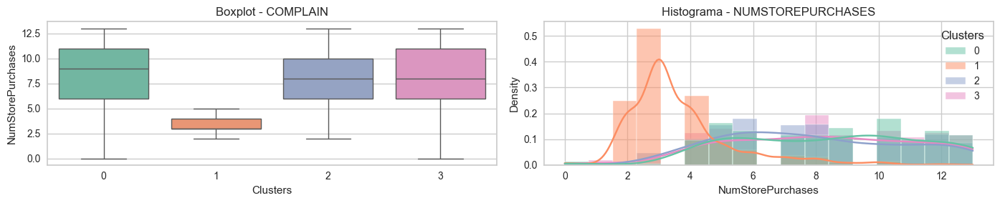

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
0,386.0,8.39,2.94,0.0,6.0,9.0,11.0,13.0
2,533.0,7.89,2.85,2.0,6.0,8.0,10.0,13.0
3,148.0,8.23,3.00,0.0,6.0,8.0,11.0,13.0
1,1148.0,3.65,1.70,0.0,3.0,3.0,4.0,13.0


In [210]:
plot_clusters_boxplot('NumStorePurchases')

##### Which groups like a discount and use it more often?

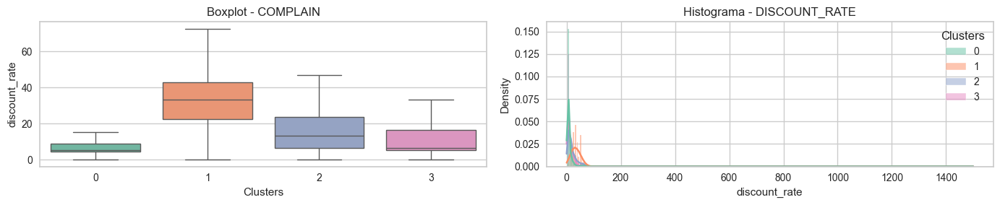

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
1,1145.0,inf,NaN,0.0,23.08,33.33,42.86,inf
2,533.0,18.26,15.16,0.0,6.67,13.33,23.81,81.25
3,148.0,11.84,10.56,0.0,5.26,6.67,16.67,57.14
0,385.0,8.84,9.58,0.0,4.55,5.56,9.09,68.18


In [211]:
plot_clusters_boxplot('discount_rate')

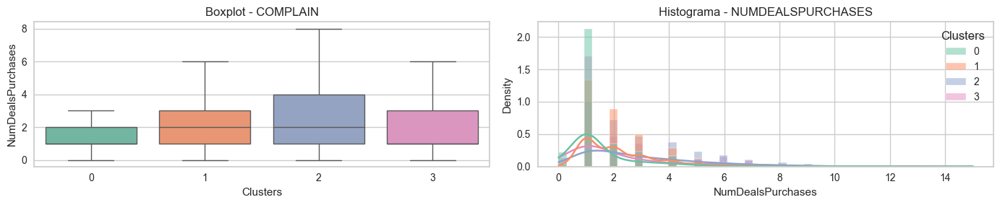

,count,mean,std,min,25%,50%,75%,max
Clusters,,,,,,,,
1,1148.0,2.21,1.55,0.0,1.0,2.0,3.0,15.0
2,533.0,3.03,2.36,0.0,1.0,2.0,4.0,15.0
0,386.0,1.68,1.80,0.0,1.0,1.0,2.0,15.0
3,148.0,2.26,2.08,0.0,1.0,1.0,3.0,11.0


In [212]:
plot_clusters_boxplot('NumDealsPurchases')

# Classification Models

In [213]:
# The goal of classification is to learn a mapping from input data to the predefined classes. 
# The class we aim to predict is Response = 1. 
# The basic idea behind classification is to identify patterns and relationships in the data that can be used to make predictions about the class of unseen data.

## Model Preparation

### Import functions

In [215]:
def calc_cross_validation(model, n_folds):

    # Cross validation by precision_score
    scorer_precision = make_scorer(precision_score)
    allPrecisionScores = cross_val_score(model, X_train, y_train, cv=n_folds, scoring=scorer_precision)
    
    # Calculate and print recall's metrics 
    print("Minimum Precision:", round(np.min(allPrecisionScores)*100,2),"%")
    print("Median Precision:", round(np.median(allPrecisionScores)*100,2),"%")
    print("Maximum Precision:", round(np.max(allPrecisionScores)*100,2),"%")
    print("Std Precision:", round(np.std(allPrecisionScores)*100,2),"%")
    print("Mean Precision:", round(np.mean(allPrecisionScores)*100,2),"%")
    print("All Precision Scores: \n", allPrecisionScores)
    
    print("\n")    
    # Cross validation by recall_score
    scorer_recall = make_scorer(recall_score)
    allRecallScores = cross_val_score(model, X_train, y_train, cv=n_folds, scoring=scorer_recall)
    
    # Calculate and print recall's metrics  
    print("Minimum Recall:", round(np.min(allRecallScores)*100,2),"%")
    print("Median Recall:", round(np.median(allRecallScores)*100,2),"%")
    print("Maximum Recall:", round(np.max(allRecallScores)*100,2),"%")
    print("Std Recall:", round(np.std(allRecallScores)*100,2),"%")
    print("Mean Recall:", round(np.mean(allRecallScores)*100,2),"%")
    print("All Recall Scores: \n", allRecallScores)

In [216]:
def print_prediction_main_metrics(df):
    print("Precision: ", round(precision_score(y_test, df)*100,2),"%")
    print("Recall: ", round(recall_score(y_test, df)*100,2),"%")
    print("F1: ", round(f1_score(y_test, df)*100,2),"%")

In [217]:
import shap

def shap_plot(model, X):
    explainer = shap.Explainer(model, X)
    shap_values = explainer(X, check_additivity=False)
    shap.summary_plot(shap_values)
    plt.show()

In [218]:
import matplotlib.pyplot as plt

def plot_feature_importances(model, feature_names, top_n=10):
    feature_importances = model.feature_importances_
    sorted_idx = feature_importances.argsort()[::-1]
    top_features = feature_names[sorted_idx][:top_n]
    top_importances = feature_importances[sorted_idx][:top_n]

    # Create a new figure
    fig, ax = plt.subplots(figsize=(10, 3))

    # Create a horizontal bar plot of feature importances
    ax.barh(top_features, top_importances, align='center')

    # Add the values of importances next to the bars
    for index, value in enumerate(top_importances):
        ax.text(value, index, f'{value:.4f}')

    plt.show()

### Create DF

In [219]:
# To make accurate predictions, we can't use all available data. 
# In this section, we will select the main predictor features.

In [220]:
df_analysis_data.head(3)

,ID,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,total_amount_spent_2y,total_sales_channel_purchases,number_of_kids,discount_rate,gold_products_amount_rate,enrollment_order,age_order,education_level,education_order_level,customer_has_a_partner,number_of_residents,income_per_people_in_the_house,percentage_income_spent_on_products,adults_count,amount_spent_on_wine_per_adult,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_fruits_per_person,amount_spent_on_fish_per_person,amount_spent_on_sweet_per_person,percentage_web_purchase_success,Clusters
0,5524,Single,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,1,1617,22,0,13.636364,5.442177,663,39,Medium,2,0,1,58138.0,2.781313,1,635.0,88.0,546.0,88.000000,172.000000,88.000000,1.142857,0
1,2174,Single,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,27,4,2,50.000000,22.222222,113,42,Medium,2,0,3,15448.0,0.058260,1,11.0,6.0,2.0,0.333333,0.666667,0.333333,0.200000,1
2,4141,Together,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,776,20,0,5.000000,5.412371,312,31,Medium,2,1,2,35806.5,1.083602,2,213.0,21.0,63.5,24.500000,55.500000,10.500000,2.000000,2


In [221]:
df_model = df_analysis_data[['Response','ID',
'percentage_income_spent_on_products','total_amount_spent_2y',
#'MntMeatProducts',
'amount_spent_on_gold_per_adult','amount_spent_on_meat_per_person','amount_spent_on_wine_per_adult','income_per_people_in_the_house',
#'MntGoldProds',
'Recency','enrollment_order','NumCatalogPurchases','NumWebPurchases',
#'MntWines',
'amount_spent_on_fruits_per_person','total_sales_channel_purchases','number_of_residents','amount_spent_on_sweet_per_person']].copy()

In [222]:
# Data validation: The df_model is going to be used to train and test the models:
df_model.head(3)

,Response,ID,percentage_income_spent_on_products,total_amount_spent_2y,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,amount_spent_on_fruits_per_person,total_sales_channel_purchases,number_of_residents,amount_spent_on_sweet_per_person
0,1,5524,2.781313,1617,88.0,546.0,635.0,58138.0,58,663,10,8,88.000000,22,1,88.000000
1,0,2174,0.058260,27,6.0,2.0,11.0,15448.0,38,113,1,1,0.333333,4,3,0.333333
2,0,4141,1.083602,776,21.0,63.5,213.0,35806.5,26,312,2,8,24.500000,20,2,10.500000


### Train test split

In [223]:
# Avoid data leakage
# Prevent overfitting

In [224]:
seed = 42
np.random.seed(seed)

X = df_model.drop(['Response','ID'],axis=1) # all features
y = df_model['Response'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, shuffle=True, stratify=y)

In [225]:
X_train.head(3)

,percentage_income_spent_on_products,total_amount_spent_2y,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,amount_spent_on_fruits_per_person,total_sales_channel_purchases,number_of_residents,amount_spent_on_sweet_per_person
1644,1.086125,823,28.0,44.666667,170.0,25258.000000,27,58,5,7,7.000000,20,3,4.666667
1016,1.921775,1363,38.0,127.000000,317.5,35462.000000,41,83,6,6,57.000000,19,2,76.000000
678,0.475861,172,9.0,25.333333,28.0,12048.333333,13,378,1,4,1.333333,8,3,0.333333


In [226]:
features = [col for col in X_train if col != 'ID']
print(features)

['percentage_income_spent_on_products', 'total_amount_spent_2y', 'amount_spent_on_gold_per_adult', 'amount_spent_on_meat_per_person', 'amount_spent_on_wine_per_adult', 'income_per_people_in_the_house', 'Recency', 'enrollment_order', 'NumCatalogPurchases', 'NumWebPurchases', 'amount_spent_on_fruits_per_person', 'total_sales_channel_purchases', 'number_of_residents', 'amount_spent_on_sweet_per_person']


In [227]:
print('Main information about the data used for model training and testing:')
print('\n> Train:')
print('Targets count:', y_train.sum())
print('Lines:', y_train.shape[0])
print('Proportion:', y_train.sum()/y_train.shape[0])
print('\n> Test:')
print('Targets count:', y_test.sum())
print('Lines:', y_test.shape[0])
print('Proportion:', y_test.sum()/y_test.shape[0])

Main information about the data used for model training and testing:

> Train:
Targets count: 266
Lines: 1772
Proportion: 0.15011286681715574

> Test:
Targets count: 67
Lines: 443
Proportion: 0.15124153498871332


## Model: DecisionTreeClassifier

### Find best estimator

In [228]:
# Finding the best set of hyperparameters for The Decision Tree Classifier model
# GridSearchCV stands for Grid Search Cross-Validation. 
# It performs an exhaustive search over a specified parameter grid, trying all possible combinations of hyperparameter values

In [229]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report

# Decision Tree classifier
pipeline_dt = Pipeline([
    ('classifier', DecisionTreeClassifier())
])

# Hyperparameters
param_grid_dt = {
    'classifier__max_depth': [4, 5, 6, 7, 8],
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__class_weight': [{0: 1, 1: 6}, {0: 1, 1: 7}, {0: 1, 1: 8}]
}

# Cross validation: hyperparameters 
grid_search_dt = GridSearchCV(pipeline_dt, param_grid_dt, cv=5, scoring=['recall', 'f1'], refit='recall')

grid_search_dt.fit(X_train, y_train)

# Save search results over specified parameter values
cv_results_dt = grid_search_dt.cv_results_

# Select the best model
best_model_dt = grid_search_dt.best_estimator_

# Best Decision Tree Model:
predictions_best_dt = best_model_dt.predict(X_test)

In [230]:
# Summarizing the main classification
print(classification_report(y_test, predictions_best_dt))

              precision    recall  f1-score   support

           0       0.96      0.69      0.80       376
           1       0.32      0.82      0.46        67

    accuracy                           0.71       443
   macro avg       0.64      0.76      0.63       443
weighted avg       0.86      0.71      0.75       443



In [231]:
# Show best results over specified parameter values

results_qt = pd.DataFrame({
    'Mean F1 Score': cv_results_dt['mean_test_f1'],
    'Mean Recall': cv_results_dt['mean_test_recall'],
    'Parameters': cv_results_dt['params']
})

results_qt.sort_values(by='Mean Recall', ascending=False).head(3)

,Mean F1 Score,Mean Recall,Parameters
5,0.417416,0.850175,"{'classifier__class_weight': {0: 1, 1: 6}, 'classifier__criterion': 'entropy', 'classifier__max_depth': 4}"
20,0.423341,0.850175,"{'classifier__class_weight': {0: 1, 1: 8}, 'classifier__criterion': 'gini', 'classifier__max_depth': 4}"
15,0.417162,0.846401,"{'classifier__class_weight': {0: 1, 1: 7}, 'classifier__criterion': 'entropy', 'classifier__max_depth': 4}"


In [232]:
# We are interested in the maximum recall but good F1 and precision as well

results_qt[results_qt['Mean F1 Score'] >= 0.4].sort_values(by='Mean Recall', ascending=False).head(3)

,Mean F1 Score,Mean Recall,Parameters
5,0.417416,0.850175,"{'classifier__class_weight': {0: 1, 1: 6}, 'classifier__criterion': 'entropy', 'classifier__max_depth': 4}"
20,0.423341,0.850175,"{'classifier__class_weight': {0: 1, 1: 8}, 'classifier__criterion': 'gini', 'classifier__max_depth': 4}"
15,0.417162,0.846401,"{'classifier__class_weight': {0: 1, 1: 7}, 'classifier__criterion': 'entropy', 'classifier__max_depth': 4}"


### Evaluate best  DecisionTreeClassifier model result

In [233]:
# Train the Decision Tree Classifier with the best hyperparameter values determined in the section above

decision_tree_model = DecisionTreeClassifier(criterion="entropy", 
                                             max_depth=4,
                                             class_weight={0: 1, 1: 8},
                                            )
decision_tree_model = decision_tree_model.fit(X_train, y_train)

predictions_dt = decision_tree_model.predict(X_test)

In [234]:
# Obtain the predicted probabilities of the positive class:
predict_proba_dt = decision_tree_model.predict_proba(X_test)[:, 1]  

In [235]:
# Metrics validation:

print(classification_report(y_test, predictions_dt))

              precision    recall  f1-score   support

           0       0.96      0.69      0.80       376
           1       0.32      0.82      0.46        67

    accuracy                           0.71       443
   macro avg       0.64      0.76      0.63       443
weighted avg       0.86      0.71      0.75       443



In [236]:
# Cross validation is a technique to evaluate the performance of a model on unseen data. 
# It involves dividing the available data into multiple folds

# The goal is to verify if the main metrics remain consistent across different subsets

calc_cross_validation(decision_tree_model, 10)

Minimum Precision: 25.32 %
Median Precision: 27.89 %
Maximum Precision: 30.49 %
Std Precision: 1.49 %
Mean Precision: 27.9 %
All Precision Scores: 
 [0.26829268 0.27380952 0.25316456 0.26470588 0.29333333 0.29069767
 0.26966292 0.2875     0.28395062 0.30487805]


Minimum Recall: 69.23 %
Median Recall: 85.19 %
Maximum Recall: 96.15 %
Std Recall: 7.08 %
Mean Recall: 84.17 %
All Recall Scores: 
 [0.81481481 0.85185185 0.76923077 0.69230769 0.84615385 0.96153846
 0.85185185 0.85185185 0.85185185 0.92592593]


In [237]:
# Metrics obtained from the model test dataset

print("Precision: ", round(precision_score(y_test, predictions_dt)*100,2),"%")
print("Recall: ", round(recall_score(y_test, predictions_dt)*100,2),"%")
print("F1: ", round(f1_score(y_test, predictions_dt)*100,2),"%")

Precision:  32.16 %
Recall:  82.09 %
F1:  46.22 %


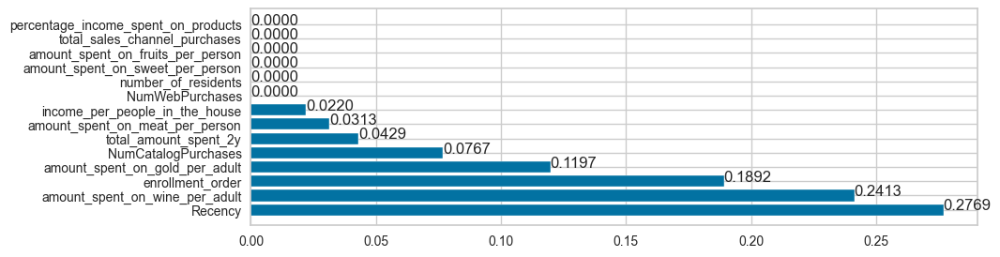

In [238]:
# Identify the most important features for the model

plot_feature_importances(decision_tree_model, X_test.columns, top_n=15)

## Model: RandomForestClassifier

### Find best estimator

In [239]:
# Finding the best set of hyperparameters for Random Forest Classifier model
# We did the same for the Decision Tree Classifier model

In [240]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Chance classifier
pipeline_rf = Pipeline([
    ('classifier', RandomForestClassifier())  
])

# Hyperparameters
param_grid_rf = {
    'classifier__n_estimators': [10, 25, 50, 75, 100],
    'classifier__max_depth': [4, 5, 6, 7, 8],
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__class_weight': [{0: 1, 1: 6}, {0: 1, 1: 7}, {0: 1, 1: 8}]
}

# Cross validation: hyperparameters 
grid_search_rf = GridSearchCV(pipeline_rf, param_grid_rf, cv=5, scoring=['recall','f1'], refit='recall')

grid_search_rf.fit(X_train, y_train)

# Save search results over specified parameter values
cv_results_rf = grid_search_rf.cv_results_

# Select the best model
best_model_rf = grid_search_rf.best_estimator_

# Best Random Forest Model:
predictions_best_rf = best_model_rf.predict(X_test)

In [241]:
# Summarizing the main classification
print(classification_report(y_test, predictions_best_rf))

              precision    recall  f1-score   support

           0       0.96      0.74      0.83       376
           1       0.36      0.82      0.50        67

    accuracy                           0.75       443
   macro avg       0.66      0.78      0.67       443
weighted avg       0.87      0.75      0.78       443



In [242]:
# Show best results over specified parameter values

results_rf = pd.DataFrame({
    'Mean F1 Score': cv_results_rf['mean_test_f1'],
    'Mean Recall': cv_results_rf['mean_test_recall'],
    'Parameters': cv_results_rf['params']
})

results_rf.sort_values(by='Mean Recall', ascending=False).head(3)

,Mean F1 Score,Mean Recall,Parameters
100,0.444414,0.816282,"{'classifier__class_weight': {0: 1, 1: 8}, 'classifier__criterion': 'gini', 'classifier__max_depth': 4, 'classifier__n_estimators': 10}"
127,0.458859,0.812439,"{'classifier__class_weight': {0: 1, 1: 8}, 'classifier__criterion': 'entropy', 'classifier__max_depth': 4, 'classifier__n_estimators': 50}"
104,0.460856,0.812229,"{'classifier__class_weight': {0: 1, 1: 8}, 'classifier__criterion': 'gini', 'classifier__max_depth': 4, 'classifier__n_estimators': 100}"


### Evaluate best RandomForestClassifier model result

In [243]:
# Train the Random Forest Classifier with the best hyperparameter values determined in the section above

from sklearn.ensemble import RandomForestClassifier

random_forest_model = RandomForestClassifier(n_estimators=100, 
                                             criterion="entropy", 
                                             max_depth=4,
                                             class_weight={0: 1, 1: 8})

random_forest_model.fit(X_train, y_train)

predictions_rf_best_model = random_forest_model.predict(X_test)

In [244]:
# Obtain the predicted probabilities of the positive class:

predict_proba_rf = random_forest_model.predict_proba(X_test)[:, 1]  

In [245]:
# Metrics validation:

print(classification_report(y_test, predictions_rf_best_model))

              precision    recall  f1-score   support

           0       0.95      0.66      0.78       376
           1       0.30      0.81      0.44        67

    accuracy                           0.68       443
   macro avg       0.62      0.73      0.61       443
weighted avg       0.85      0.68      0.73       443



In [246]:
# The goal is to verify if the main metrics remain consistent across different subsets

calc_cross_validation(random_forest_model, 10)

Minimum Precision: 27.63 %
Median Precision: 32.61 %
Maximum Precision: 38.18 %
Std Precision: 3.11 %
Mean Precision: 32.98 %
All Precision Scores: 
 [0.36065574 0.31168831 0.27631579 0.38181818 0.3        0.33333333
 0.30985915 0.33846154 0.31884058 0.36666667]


Minimum Recall: 73.08 %
Median Recall: 84.9 %
Maximum Recall: 96.15 %
Std Recall: 6.92 %
Mean Recall: 83.43 %
All Recall Scores: 
 [0.85185185 0.88888889 0.73076923 0.73076923 0.84615385 0.96153846
 0.88888889 0.85185185 0.77777778 0.81481481]


In [247]:
# Metrics obtained from the model test dataset

print('predictions_rf_best_model \n')
print_prediction_main_metrics(predictions_rf_best_model)

predictions_rf_best_model 

Precision:  29.83 %
Recall:  80.6 %
F1:  43.55 %


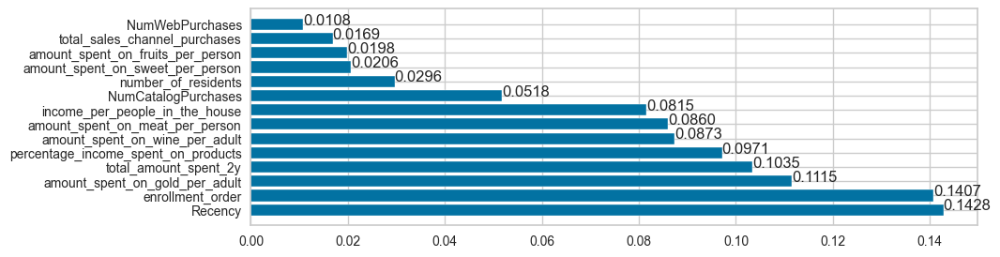

In [248]:
# Identify the most important features for the model

plot_feature_importances(random_forest_model, X_test.columns, top_n=15)

## Model: LogisticRegression

### 1st try: using the same features 

#### Find best estimator

In [249]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression classifier
pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),  # Normalization step
    ('classifier', LogisticRegression())  
])

# Hyperparameters
param_grid_lr = {
    'classifier__C': [0.1, 1.0, 10, 100],
    'classifier__class_weight': [{0: 1, 1: 6}, {0: 1, 1: 8}, {0: 1, 1: 10}, 'balanced'],
    'classifier__solver': ['liblinear', 'lbfgs']
}

# Cross validation: hyperparameters 
grid_search_lr = GridSearchCV(pipeline_lr, param_grid_lr, cv=5, scoring=['recall','f1'], refit='recall')

grid_search_lr.fit(X_train, y_train)

# Save search results over specified parameter values
cv_results_lr = grid_search_lr.cv_results_

# Select the best model
best_model_lr = grid_search_lr.best_estimator_

# Best Logistic Regression Model:
predictions_best_lr = best_model_lr.predict(X_test)

In [250]:
print(classification_report(y_test, predictions_best_lr))

              precision    recall  f1-score   support

           0       0.96      0.65      0.77       376
           1       0.30      0.84      0.44        67

    accuracy                           0.68       443
   macro avg       0.63      0.74      0.61       443
weighted avg       0.86      0.68      0.72       443



In [251]:
# Show best results over specified parameter values

results_lr = pd.DataFrame({
    'Mean F1 Score': cv_results_lr['mean_test_f1'],
    'Mean Recall': cv_results_lr['mean_test_recall'],
    'Parameters': cv_results_lr['params']
})

results_lr.sort_values(by='Mean Recall', ascending=False).head(3)

,Mean F1 Score,Mean Recall,Parameters
5,0.439916,0.853599,"{'classifier__C': 0.1, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'lbfgs'}"
4,0.439916,0.853599,"{'classifier__C': 0.1, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'liblinear'}"
12,0.449396,0.853599,"{'classifier__C': 1.0, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'liblinear'}"


#### Evaluate best LogisticRegression model result

In [252]:
# Create and fit StandardScaler on training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply the same scaler to the test data
X_test_scaled = scaler.transform(X_test)

# Create logistic regression model
logistic_regression_model = LogisticRegression(C=0.1, 
                                               class_weight={0: 1, 1: 10},
                                               solver='lbfgs'
                                              )

# Train model on scaled training data
logistic_regression_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
predictions_lr_best_model = logistic_regression_model.predict(X_test_scaled)

In [253]:
predict_proba_lr_1 = logistic_regression_model.predict_proba(X_test_scaled)[:, 1]  

In [254]:
print(classification_report(y_test, predictions_lr_best_model))

              precision    recall  f1-score   support

           0       0.96      0.65      0.78       376
           1       0.30      0.84      0.44        67

    accuracy                           0.68       443
   macro avg       0.63      0.75      0.61       443
weighted avg       0.86      0.68      0.73       443



In [255]:
calc_cross_validation(logistic_regression_model, 10)

Minimum Precision: 20.83 %
Median Precision: 26.67 %
Maximum Precision: 28.26 %
Std Precision: 2.26 %
Mean Precision: 25.81 %
All Precision Scores: 
 [0.25641026 0.25263158 0.20833333 0.22619048 0.26804124 0.28089888
 0.26530612 0.26966292 0.2826087  0.27058824]


Minimum Recall: 73.08 %
Median Recall: 88.89 %
Maximum Recall: 100.0 %
Std Recall: 9.46 %
Mean Recall: 87.58 %
All Recall Scores: 
 [0.74074074 0.88888889 0.76923077 0.73076923 1.         0.96153846
 0.96296296 0.88888889 0.96296296 0.85185185]


In [256]:
print('predictions_lr_best_model \n')
print_prediction_main_metrics(predictions_lr_best_model)

predictions_lr_best_model 

Precision:  30.11 %
Recall:  83.58 %
F1:  44.27 %


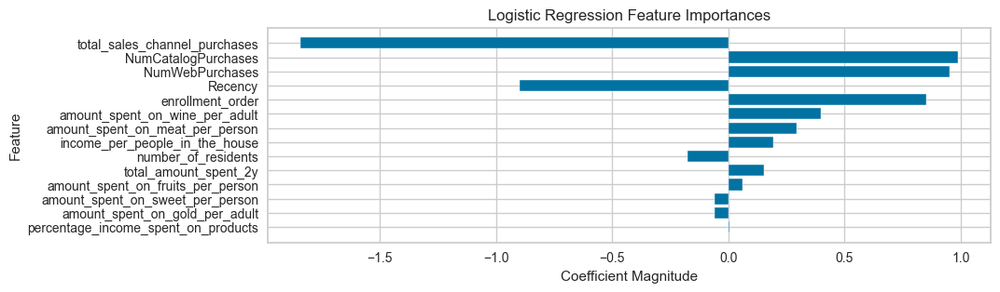

In [257]:
# Get the coefficients from the logistic regression model
coefficients = logistic_regression_model.coef_[0]

# Get the feature names
feature_names = X_train.columns

# Sort the coefficients and feature names
sorted_indices = np.argsort(np.abs(coefficients))
coefficients = coefficients[sorted_indices]
feature_names = feature_names[sorted_indices]

# Plot the feature importances
plt.figure(figsize=(10, 3))
plt.barh(range(len(feature_names)), coefficients, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Feature')
plt.title('Logistic Regression Feature Importances')
plt.show()

In [258]:
# Get the coefficients of the trained model
coefficients = logistic_regression_model.coef_

# Create a dictionary with the variable names and their respective coefficients
coefficients_dict = {}
for feature, coef in zip(X_train.columns, coefficients[0]):
    coefficients_dict[feature] = coef

# Display the weights of each variable
print("Variable weights:")
for feature, coef in coefficients_dict.items():
    print(f"{feature}: {coef}")

Variable weights:
percentage_income_spent_on_products: 0.0067186677859156045
total_amount_spent_2y: 0.15539874317117675
amount_spent_on_gold_per_adult: -0.057938306560357936
amount_spent_on_meat_per_person: 0.29377249707845837
amount_spent_on_wine_per_adult: 0.3965331979527777
income_per_people_in_the_house: 0.1943028788675319
Recency: -0.8972049618104767
enrollment_order: 0.8509505668518195
NumCatalogPurchases: 0.9878540963523791
NumWebPurchases: 0.953732091015319
amount_spent_on_fruits_per_person: 0.06092504805325613
total_sales_channel_purchases: -1.8406007701605984
number_of_residents: -0.17724864512160587
amount_spent_on_sweet_per_person: -0.05985006515231168


In [259]:
# A high total_sales_channel_purchases indicates a lower probability that the client will accept the offer. 
# It doesn't really make sense. 
# Let's try to train the model with less information

### 2nd try: drop some columns

#### Find best estimator

In [260]:
# Dropping columns that were not evaluated as I would like in the feature importance

strategic_column_drop = ['total_sales_channel_purchases','NumCatalogPurchases','NumWebPurchases','Recency', 'enrollment_order']

# Create new train DF
X_train_rl = X_train.drop(strategic_column_drop, axis=1)

In [261]:
# Create new test DF

X_test_rl = X_test.drop(strategic_column_drop, axis=1)

In [262]:
# Data validation 
X_train_rl.head(3)

,percentage_income_spent_on_products,total_amount_spent_2y,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,amount_spent_on_fruits_per_person,number_of_residents,amount_spent_on_sweet_per_person
1644,1.086125,823,28.0,44.666667,170.0,25258.000000,7.000000,3,4.666667
1016,1.921775,1363,38.0,127.000000,317.5,35462.000000,57.000000,2,76.000000
678,0.475861,172,9.0,25.333333,28.0,12048.333333,1.333333,3,0.333333


In [263]:
# Logistic Regression classifier
pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),  # Normalization step
    ('classifier', LogisticRegression())  
])

# Hyperparameters
param_grid_lr = {
    'classifier__C': [0.1, 1.0, 10, 100],
    'classifier__class_weight': [{0: 1, 1: 6}, {0: 1, 1: 8}, {0: 1, 1: 10}, 'balanced'],
    'classifier__solver': ['liblinear', 'lbfgs']
}

# Cross validation: hyperparameters 
grid_search_lr = GridSearchCV(pipeline_lr, param_grid_lr, cv=5, scoring=['recall','f1'], refit='recall')

grid_search_lr.fit(X_train_rl, y_train)

# Save search results over specified parameter values
cv_results_lr = grid_search_lr.cv_results_

# Select the best model
best_model_lr = grid_search_lr.best_estimator_

# Best Logistic Regression Model:
predictions_best_lr = best_model_lr.predict(X_test_rl)

In [264]:
# Show best results over specified parameter values

results_lr = pd.DataFrame({
    'Mean F1 Score': cv_results_lr['mean_test_f1'],
    'Mean Recall': cv_results_lr['mean_test_recall'],
    'Parameters': cv_results_lr['params']
})

results_lr.sort_values(by='Mean Recall', ascending=False).head(3)

,Mean F1 Score,Mean Recall,Parameters
12,0.317333,0.819497,"{'classifier__C': 1.0, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'liblinear'}"
13,0.317333,0.819497,"{'classifier__C': 1.0, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'lbfgs'}"
20,0.317770,0.819497,"{'classifier__C': 10, 'classifier__class_weight': {0: 1, 1: 10}, 'classifier__solver': 'liblinear'}"


In [265]:
results_lr[results_lr['Mean F1 Score'] >= 0.35].sort_values(by='Mean Recall', ascending=False).head(2) # Bad results

,Mean F1 Score,Mean Recall,Parameters
1,0.350166,0.571349,"{'classifier__C': 0.1, 'classifier__class_weight': {0: 1, 1: 6}, 'classifier__solver': 'lbfgs'}"
9,0.351007,0.567645,"{'classifier__C': 1.0, 'classifier__class_weight': {0: 1, 1: 6}, 'classifier__solver': 'lbfgs'}"


#### Evaluate best LogisticRegression model result after column drop

In [266]:
# Create and fit StandardScaler on training data
scaler = StandardScaler()
X_train_rl_scaled = scaler.fit_transform(X_train_rl)

# Apply the same scaler to the test data
X_test_rl_scaled = scaler.transform(X_test_rl)

# Create logistic regression model
logistic_regression_model_2 = LogisticRegression(C=0.1, 
                                               class_weight={0: 1, 1: 10},
                                               solver='liblinear'
                                              )

# Train model on scaled training data
logistic_regression_model_2.fit(X_train_rl_scaled, y_train)

# Make predictions on the scaled test data
predictions_lr_best_model_2 = logistic_regression_model_2.predict(X_test_rl_scaled)

In [267]:
predict_proba_lr_2 = logistic_regression_model_2.predict_proba(X_test_rl_scaled)[:, 1]  

In [268]:
print(classification_report(y_test, predictions_lr_best_model_2))

              precision    recall  f1-score   support

           0       0.94      0.43      0.59       376
           1       0.21      0.84      0.33        67

    accuracy                           0.49       443
   macro avg       0.57      0.63      0.46       443
weighted avg       0.83      0.49      0.55       443



In [269]:
calc_cross_validation(logistic_regression_model_2, 10)

Minimum Precision: 25.33 %
Median Precision: 30.66 %
Maximum Precision: 33.8 %
Std Precision: 2.6 %
Mean Precision: 30.29 %
All Precision Scores: 
 [0.31666667 0.33802817 0.26829268 0.25333333 0.33333333 0.32051282
 0.28205128 0.30379747 0.30769231 0.30555556]


Minimum Recall: 70.37 %
Median Recall: 86.75 %
Maximum Recall: 100.0 %
Std Recall: 8.8 %
Mean Recall: 85.38 %
All Recall Scores: 
 [0.7037037  0.88888889 0.84615385 0.73076923 1.         0.96153846
 0.81481481 0.88888889 0.88888889 0.81481481]


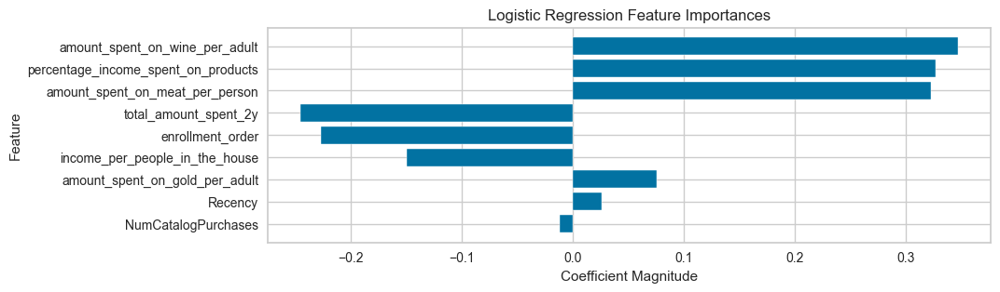

In [270]:
# Get the coefficients from the logistic regression model
coefficients = logistic_regression_model_2.coef_[0]

# Get the feature names
feature_names = X_train.columns

# Sort the coefficients and feature names
sorted_indices = np.argsort(np.abs(coefficients))
coefficients = coefficients[sorted_indices]
feature_names = feature_names[sorted_indices]

# Plot the feature importances
plt.figure(figsize=(10, 3))
plt.barh(range(len(feature_names)), coefficients, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Feature')
plt.title('Logistic Regression Feature Importances')
plt.show()

### Compare trained RL models

In [271]:
# The second one's performance is better, it makes more sense
# However, we have to evaluate other factors before making the decision

In [272]:
# Get the coefficients of the trained model
coefficients = logistic_regression_model.coef_

# Create a dictionary with the variable names and their respective coefficients
coefficients_dict = {}
for feature, coef in zip(X_train.columns, coefficients[0]):
    coefficients_dict[feature] = coef

# Display the weights of each variable
print("Variable weights:")

weights_df = pd.DataFrame(list(coefficients_dict.items()), columns=['Variable', 'Weight'])
weights_df.sort_values(by='Weight', ascending=False)

Variable weights:


,Variable,Weight
8,NumCatalogPurchases,0.987854
9,NumWebPurchases,0.953732
7,enrollment_order,0.850951
4,amount_spent_on_wine_per_adult,0.396533
3,amount_spent_on_meat_per_person,0.293772
5,income_per_people_in_the_house,0.194303
1,total_amount_spent_2y,0.155399
10,amount_spent_on_fruits_per_person,0.060925
0,percentage_income_spent_on_products,0.006719
2,amount_spent_on_gold_per_adult,-0.057938


In [273]:
# Get the coefficients of the trained model
coefficients = logistic_regression_model_2.coef_

# Create a dictionary with the variable names and their respective coefficients
coefficients_dict = {}
for feature, coef in zip(X_train_rl.columns, coefficients[0]):
    coefficients_dict[feature] = coef

# Display the weights of each variable
print("Variable weights:")

weights_df = pd.DataFrame(list(coefficients_dict.items()), columns=['Variable', 'Weight'])
weights_df.sort_values(by='Weight', ascending=False)

Variable weights:


,Variable,Weight
4,amount_spent_on_wine_per_adult,0.346575
0,percentage_income_spent_on_products,0.326683
3,amount_spent_on_meat_per_person,0.322241
2,amount_spent_on_gold_per_adult,0.075628
6,amount_spent_on_fruits_per_person,0.025740
8,amount_spent_on_sweet_per_person,-0.011933
5,income_per_people_in_the_house,-0.150179
7,number_of_residents,-0.227066
1,total_amount_spent_2y,-0.245422


# Model interpretation

In [274]:
# We want to decide which model is the best one to predict good clients and maximize the company's profit
# Let's evaluate from different perspectives

## Evaluation by main metrics

In [275]:
# Assessing the model's performance using key metrics
# The Decision Tree seems to be the best model, but there's not a big difference between them

In [276]:
print('Decision Tree: \n')
print_prediction_main_metrics(predictions_dt)

Decision Tree: 

Precision:  32.16 %
Recall:  82.09 %
F1:  46.22 %


In [277]:
print('Random forest: \n')
print_prediction_main_metrics(predictions_rf_best_model)

Random forest: 

Precision:  29.83 %
Recall:  80.6 %
F1:  43.55 %


In [278]:
print('Logistic Regression (1st try): \n')
print_prediction_main_metrics(predictions_lr_best_model)

Logistic Regression (1st try): 

Precision:  30.11 %
Recall:  83.58 %
F1:  44.27 %


In [279]:
print('Logistic Regression (2nd try): \n')
print_prediction_main_metrics(predictions_lr_best_model_2)

Logistic Regression (2nd try): 

Precision:  20.59 %
Recall:  83.58 %
F1:  33.04 %


In [280]:
# Additionally, we can evaluate them more thoroughly through cross-validation 
# We can verify if the main metrics remain consistent across different subsets

In [281]:
calc_cross_validation(decision_tree_model, 10)

Minimum Precision: 25.32 %
Median Precision: 27.89 %
Maximum Precision: 30.49 %
Std Precision: 1.56 %
Mean Precision: 27.82 %
All Precision Scores: 
 [0.26829268 0.27380952 0.25316456 0.26470588 0.29333333 0.29069767
 0.26136364 0.2875     0.28395062 0.30487805]


Minimum Recall: 69.23 %
Median Recall: 85.19 %
Maximum Recall: 96.15 %
Std Recall: 7.22 %
Mean Recall: 84.54 %
All Recall Scores: 
 [0.81481481 0.85185185 0.76923077 0.69230769 0.84615385 0.96153846
 0.88888889 0.85185185 0.85185185 0.92592593]


In [282]:
calc_cross_validation(random_forest_model, 10)

Minimum Precision: 25.64 %
Median Precision: 31.73 %
Maximum Precision: 37.04 %
Std Precision: 3.25 %
Mean Precision: 32.16 %
All Precision Scores: 
 [0.34375    0.31578947 0.25641026 0.37037037 0.28571429 0.31578947
 0.30555556 0.34848485 0.31884058 0.35483871]


Minimum Recall: 76.92 %
Median Recall: 83.05 %
Maximum Recall: 92.31 %
Std Recall: 4.19 %
Mean Recall: 83.83 %
All Recall Scores: 
 [0.81481481 0.88888889 0.76923077 0.80769231 0.84615385 0.92307692
 0.81481481 0.85185185 0.85185185 0.81481481]


In [283]:
calc_cross_validation(logistic_regression_model, 10)

Minimum Precision: 20.83 %
Median Precision: 26.67 %
Maximum Precision: 28.26 %
Std Precision: 2.26 %
Mean Precision: 25.81 %
All Precision Scores: 
 [0.25641026 0.25263158 0.20833333 0.22619048 0.26804124 0.28089888
 0.26530612 0.26966292 0.2826087  0.27058824]


Minimum Recall: 73.08 %
Median Recall: 88.89 %
Maximum Recall: 100.0 %
Std Recall: 9.46 %
Mean Recall: 87.58 %
All Recall Scores: 
 [0.74074074 0.88888889 0.76923077 0.73076923 1.         0.96153846
 0.96296296 0.88888889 0.96296296 0.85185185]


In [284]:
calc_cross_validation(logistic_regression_model_2, 10)

Minimum Precision: 25.33 %
Median Precision: 30.66 %
Maximum Precision: 33.8 %
Std Precision: 2.6 %
Mean Precision: 30.29 %
All Precision Scores: 
 [0.31666667 0.33802817 0.26829268 0.25333333 0.33333333 0.32051282
 0.28205128 0.30379747 0.30769231 0.30555556]


Minimum Recall: 70.37 %
Median Recall: 86.75 %
Maximum Recall: 100.0 %
Std Recall: 8.8 %
Mean Recall: 85.38 %
All Recall Scores: 
 [0.7037037  0.88888889 0.84615385 0.73076923 1.         0.96153846
 0.81481481 0.88888889 0.88888889 0.81481481]


## Evaluation by probability distribution

In [285]:
# It's better if the model's probability is correlated to the amount spent by each customer, as we want to maximize the campaign's profit

### Add predict column to Test Data

In [286]:
X_test.head(2)

,percentage_income_spent_on_products,total_amount_spent_2y,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,amount_spent_on_fruits_per_person,total_sales_channel_purchases,number_of_residents,amount_spent_on_sweet_per_person
2120,0.327921,123,2.5,18.666667,18.5,12503.0,24,655,0,3,1.666667,7,3,2.666667
1446,1.690137,1319,8.5,276.500000,241.0,39020.5,93,560,4,4,17.500000,17,2,80.000000


In [287]:
# Copy test data to evaluate predictions

df_evaluate_models = X_test.copy() 

In [288]:
df_evaluate_models['Response'] = y_test  # Add a column for actual target labels to the test DataFrame

In [289]:
df_evaluate_models['predict_DT'] = predictions_dt

In [290]:
df_evaluate_models['predict_proba_DT'] = predict_proba_dt

In [291]:
df_evaluate_models['predict_RF'] = predictions_rf_best_model 

In [292]:
df_evaluate_models['predict_proba_RF'] = predict_proba_rf 

In [293]:
df_evaluate_models['predict_LR_1'] = predictions_lr_best_model  

In [294]:
df_evaluate_models['predict_proba_LR_1'] = predict_proba_lr_1  

In [295]:
# RL 2 was the worst model. We won't evaluate it.
# df_evaluate_models['predict_logistic_regression_2'] = predictions_lr_best_model_2 

In [296]:
# View the dataframe that is going to be used to evaluate the predictions
df_evaluate_models.head(3)

,percentage_income_spent_on_products,total_amount_spent_2y,amount_spent_on_gold_per_adult,amount_spent_on_meat_per_person,amount_spent_on_wine_per_adult,income_per_people_in_the_house,Recency,enrollment_order,NumCatalogPurchases,NumWebPurchases,amount_spent_on_fruits_per_person,total_sales_channel_purchases,number_of_residents,amount_spent_on_sweet_per_person,Response,predict_DT,predict_proba_DT,predict_RF,predict_proba_RF,predict_LR_1,predict_proba_LR_1
2120,0.327921,123,2.5,18.666667,18.5,12503.00,24,655,0,3,1.666667,7,3,2.666667,0,1,0.625000,0,0.494826,1,0.782461
1446,1.690137,1319,8.5,276.500000,241.0,39020.50,93,560,4,4,17.500000,17,2,80.000000,0,0,0.444444,1,0.508443,0,0.344031
579,0.415728,227,2.0,11.500000,72.5,13650.75,85,355,2,4,3.250000,10,4,0.500000,0,0,0.000000,0,0.297069,0,0.158337


### Probability distribution versus total amount spent

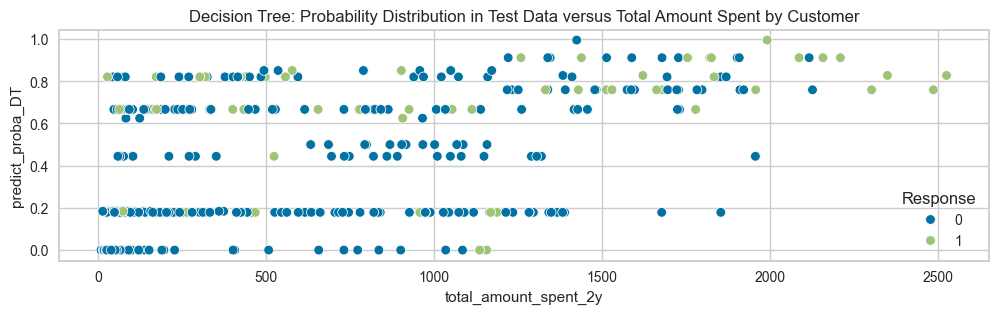

In [305]:
plt.figure(figsize=(12, 3))
sns.scatterplot(data=df_evaluate_models, x='total_amount_spent_2y', y='predict_proba_DT', hue='Response')
plt.title('Decision Tree: Probability Distribution in Test Data versus Total Amount Spent by Customer')
plt.show()

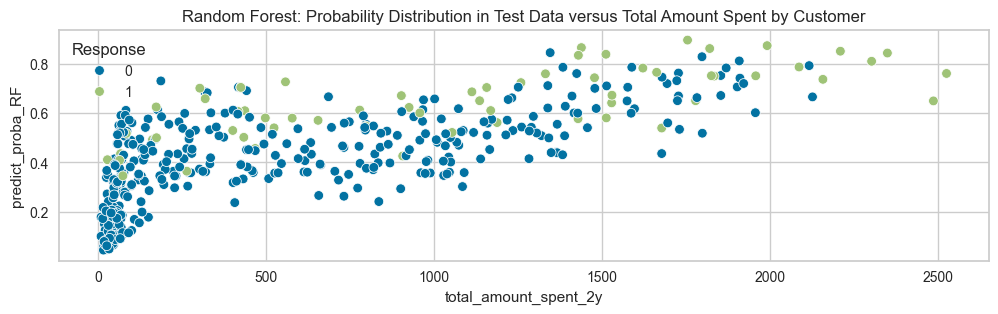

In [306]:
plt.figure(figsize=(12, 3))
sns.scatterplot(data=df_evaluate_models, x='total_amount_spent_2y', y='predict_proba_RF', hue='Response')
plt.title('Random Forest: Probability Distribution in Test Data versus Total Amount Spent by Customer')
plt.show()

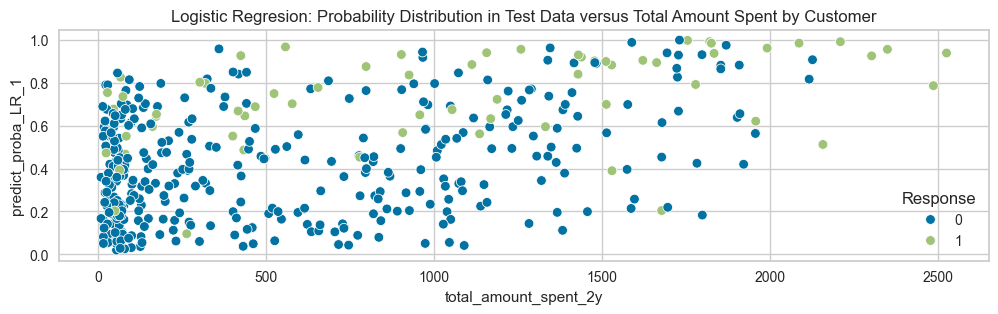

In [307]:
plt.figure(figsize=(12, 3))
sns.scatterplot(data=df_evaluate_models, x='total_amount_spent_2y', y='predict_proba_LR_1', hue='Response')
plt.title('Logistic Regresion: Probability Distribution in Test Data versus Total Amount Spent by Customer')
plt.show()

## Best model's evaluation

In [300]:
# The Random Forest model is the best choice for predicting clients to maximize the company's profit
# It segments clients who have spent more in the last 2 years very effectively. 
# Interpretation: the higher the amount spent in the last 2 years, the greater the likelihood of them accepting an offer.

In [301]:
# Now, let's try different Random Forest's thresholds

# We can reduce the model's threshold if we want to maximize the potential client's recall
# This action decreases the precision of the campaign in order to broaden the reach to potential customers.

In [302]:
threshold_tests = [0.4, 0.45, 0.5]

main_metrics_results = {"Threshold": [], "Precision": [], "Recall": [], "F1": []}

for threshold in threshold_tests:
    
    new_predict_threshold = (predict_proba_rf >= threshold).astype(int)
    
    # Calcule e imprima as métricas
    precision = round(precision_score(y_test, new_predict_threshold)*100,2)
    recall = round(recall_score(y_test, new_predict_threshold)*100,2)
    
    f1 = round(f1_score(y_test, new_predict_threshold)*100,2)
    
    # Armazenar os resultados no dicionário
    main_metrics_results["Threshold"].append(threshold)
    main_metrics_results["Precision"].append(precision)
    main_metrics_results["Recall"].append(recall)
    main_metrics_results["F1"].append(f1)

df_main_metrics_results = pd.DataFrame(main_metrics_results)

df_main_metrics_results

,Threshold,Precision,Recall,F1
0,0.40,23.75,92.54,37.80
1,0.45,26.36,86.57,40.42
2,0.50,29.83,80.60,43.55


# Conclusion

In [311]:
# If we choose the threshold of 0.4, what amount of sales do we achieve?

financial_recall = df_evaluate_models[(df_evaluate_models['predict_proba_RF'] >= 0.4) & (df_evaluate_models['Response'] == 1)].total_amount_spent_2y.sum()*100 /  df_evaluate_models[(df_evaluate_models['Response'] == 1)].total_amount_spent_2y.sum()
print(f'>> Financial Recall: {round(financial_recall,2)}%')

# It seems very good!!!!

>> Financial Recall: 99.34%


In [310]:
# The choice of the threshold has to be based on what is more important to the company.

# Key questions:

## Do we want to maximize the reach of potential clients? 
### If so, it's interesting to choose threshold = 0.4
### For the presentation to business stakeholders, it's the chosen option!!!!!

## Or is it also important to direct the campaign to clients that we are more certain will accept the offer?
### If so, it's interesting to choose threshold = 0.5